In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import skimage.exposure
plt.rcParams["figure.figsize"] = (10,10)

In [507]:
plt.rcParams["figure.figsize"] = (10,10)

TypeError: Image data of dtype object cannot be converted to float

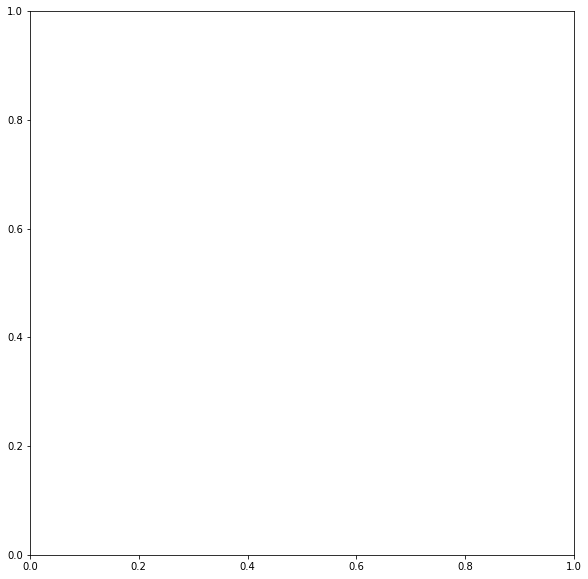

In [11]:
src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0016_08_min.bmp")
plt.imshow(src)
plt.show()
print(src.dtype, src.shape)
gray_src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0016_08_min.bmp", cv.IMREAD_GRAYSCALE)
plt.imshow(gray_src)
plt.show()
print(gray_src.dtype, gray_src.shape)
#ctrs, hier = cv.findContours(gray_src, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
gray = cv.cvtColor(src, cv.COLOR_RGB2GRAY) 
gray = 255*(gray < 128).astype(np.uint8) # To invert the text to white
coords = cv2.findNonZero(gray) # Find all non-zero points 
x, y, w, h = cv2.boundingRect(coords) # Find minimum spanning bounding box
rect = src[y:y+h, x:x+w] # Crop the image - note we do this on the original image
plt.imshow(rect)
plt.show()

In [12]:
ROI = np.zeros(src.shape, np.uint8)
gray = cv.cvtColor(src, cv.COLOR_RGB2GRAY) 
#gray_img = plt.imshow(gray)
print(gray.dtype, gray.shape)

im_gray = cv.GaussianBlur(src, (5, 5), 0)

#ret, im_th = cv.threshold(im_gray, 90, 255, cv.THRESH_BINARY_INV)
ret, im_th_1 = cv.threshold(src, 0, 255, cv.THRESH_BINARY_INV)
ret, im_th_2 = cv.threshold(gray_src, 90, 255, cv.THRESH_BINARY_INV)
ret, im_th = cv.threshold(gray, 90, 255, cv.THRESH_BINARY_INV)
plt.imshow(im_th_1)
plt.show()
plt.imshow(im_th_2)
plt.show()
plt.imshow(im_gray)
plt.show()
plt.imshow(im_th)
plt.show()
#gray = cv.cvtColor(im_th, cv.COLOR_BGR2GRAY) 
#plt.imshow(gray)
#plt.show()
gray = cv.cvtColor(im_th_1, cv.COLOR_BGR2GRAY) 
plt.imshow(gray)
plt.show()
gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY) 
plt.imshow(gray)
plt.show()
gray = cv.cvtColor(im_gray, cv.COLOR_BGR2GRAY) 
plt.imshow(gray)
plt.show()

AttributeError: 'NoneType' object has no attribute 'shape'

(512, 512, 3) uint8


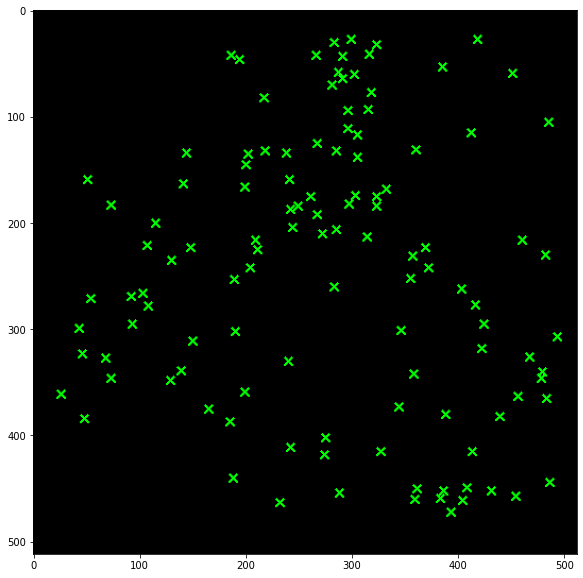

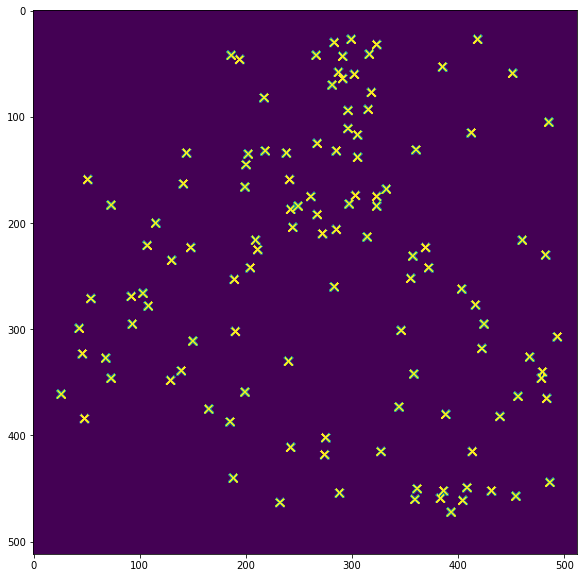

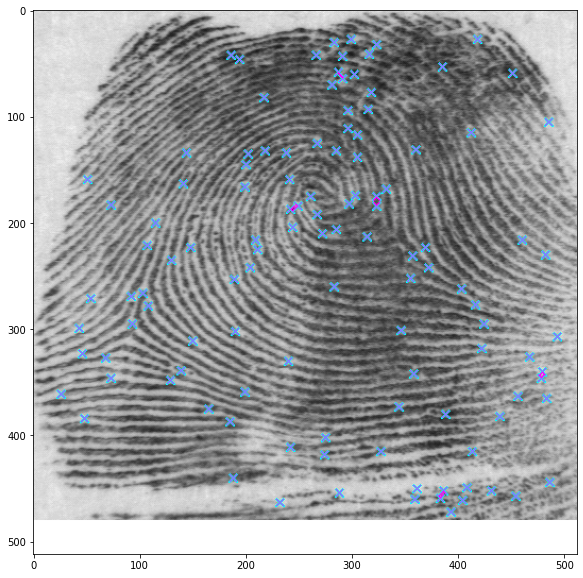

In [266]:
print(im_th_1.shape, im_th_1.dtype)
#im_th_1 = cv.cvtColor(im_th_1, cv.COLOR_RGB2GRAY) 
im_th_1_gray = cv.cvtColor(im_th_1, cv.COLOR_RGB2GRAY) 
ctrs, hier = cv.findContours(im_th_1_gray, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

#print(ctrs)

plt.imshow(im_th_1)
plt.show()

plt.imshow(im_th_1_gray)
plt.show()

img = cv.drawContours(src.copy(), ctrs, -1, (0,255,255), 1)
plt.imshow(img)
plt.show()

ctrs, hier = cv.findContours(gray.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#print(ctrs)
img = cv.drawContours(src.copy(), ctrs, -1, (0,255,255), 1)
plt.imshow(img)
plt.show()




#image, ctrs, hier = cv.findContours(gray.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#image, ctrs, hier = cv.findContours(im_th_1.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#image, ctrs, hier = cv.findContours(im_gray.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#image, ctrs, hier = cv.findContours(src.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#image, ctrs, hier = cv.findContours(im_th.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

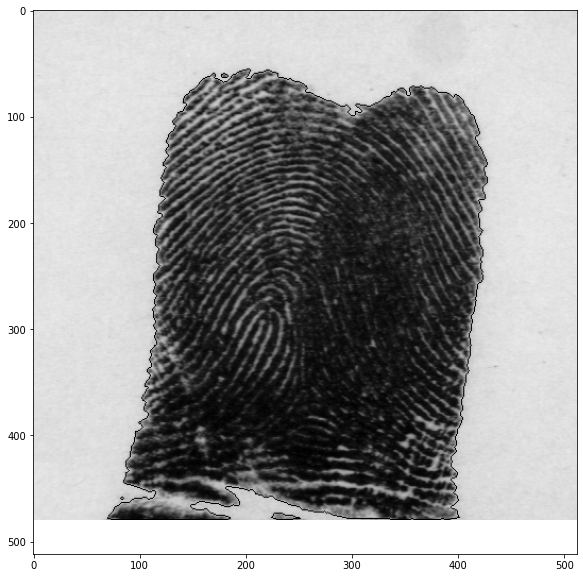

/mnt/d/Biometrics Project/python/venv/lib/python3.6/site-packages/ipykernel_launcher.py:52: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


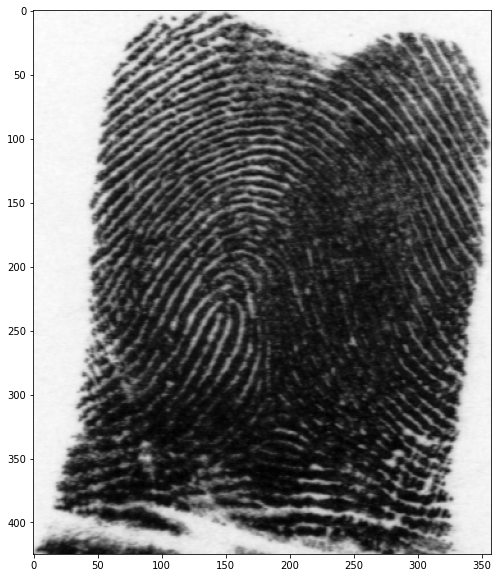

<Figure size 576x576 with 0 Axes>

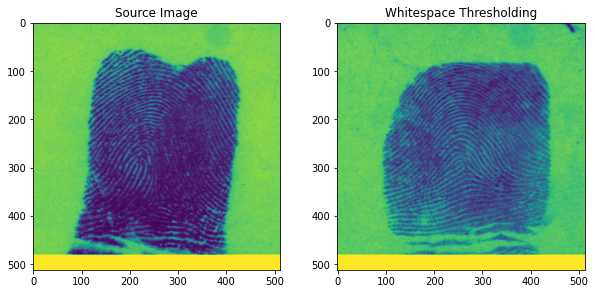

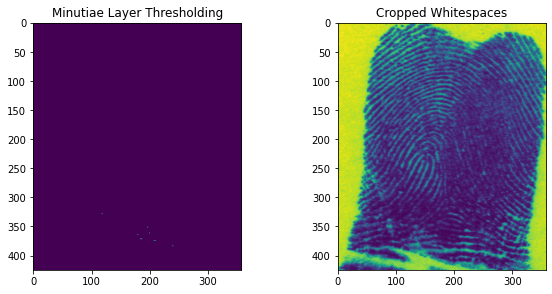

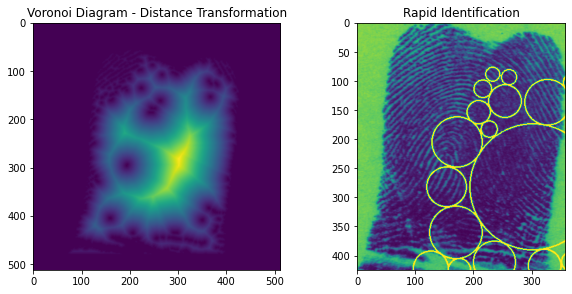

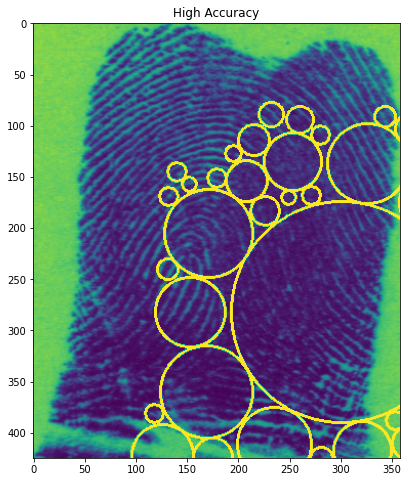

In [190]:
name = 'f0343_09'
src = cv.imread('/mnt/d/Biometrics Project/python/open_fields/' + name + '.bmp', cv2.IMREAD_UNCHANGED)

#gray = cv.cvtColor(src, cv.COLOR_RGB2GRAY)
#src = src.astype(np.uint8)
#ctrs, hier = cv.findContours(src.copy(), cv2.RETR_FLOODFILL, cv.CHAIN_APPROX_SIMPLE)

blur = cv2.GaussianBlur(src,(5,5),0) # apply blur for contour
ret, binary = cv2.threshold(blur,160,255,cv2.THRESH_BINARY_INV) # apply threshold to blur image
#plt.imshow(binary, cmap='Greys_r')
#plt.show()

ctrs, hier = cv.findContours(binary, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
img = cv.drawContours(src.copy(), ctrs, -1, (0,255,0), 1)
plt.imshow(img, cmap='Greys_r')
plt.show()


contours = ctrs
def find_if_close(cnt1,cnt2):
    row1,row2 = cnt1.shape[0],cnt2.shape[0]
    for i in range(row1):
        for j in range(row2):
            disty = np.linalg.norm(cnt1[i]-cnt2[j])
            if abs(disty) < 40 :
                return True
            elif i==row1-1 and j==row2-1:
                return False
            
            
LENGTH = len(ctrs)
status = np.zeros((LENGTH,1))

for i,cnt1 in enumerate(contours):
    x = i    
    if i != LENGTH-1:
        for j,cnt2 in enumerate(contours[i+1:]):
            x = x+1
            disty = find_if_close(cnt1,cnt2)
            if disty == True:
                val = min(status[i],status[x])
                status[x] = status[i] = val
            else:
                if status[x]==status[i]:
                    status[x] = i+1

unified = []
maximum = int(status.max())+1
for i in range(maximum):
    pos = np.where(status==i)[0]
    if pos.size != 0:
        cont = np.vstack(contours[i] for i in pos)
        hull = cv.convexHull(cont)
        unified.append(hull)

# img_1 = cv.drawContours(src.copy(),unified,-1,(0,255,0),1)
# plt.imshow(img_1, cmap='Greys_r')
# plt.show()


# x = cv2.minAreaRect(unified[0])
# box = cv.boxPoints(x)
# box = np.intp(box)
# #rect = src[y:y+h, x:x+w]
# img_1 = cv.drawContours(src, [box],-1,(0,255,0),1)
# plt.imshow(img_1, cmap='Greys_r')
# plt.show()




x, y, w, h = cv2.boundingRect(unified[0])
rect = src[y:y+h, x:x+w]
plt.imshow(rect, cmap='Greys_r')
plt.show()



ret, im_th_1 = cv.threshold(rect, 0, 255, cv.THRESH_BINARY_INV)
img = im_th_1.copy()

#img = img_2.copy()

gray = src#cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold to binary and invert so background is white and xxx are black
thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)[1]
thresh = 255 - thresh

# add black border around threshold image to avoid corner being largest distance
thresh2 = cv2.copyMakeBorder(thresh, 1,1,1,1, cv2.BORDER_CONSTANT, (0))
h, w = thresh2.shape

# create zeros mask 2 pixels larger in each dimension
mask = np.zeros([h + 2, w + 2], np.uint8)

# apply distance transform
distimg = thresh2.copy()
distimg = cv2.distanceTransform(distimg, cv2.DIST_L2, 5)

# remove excess border
distimg = distimg[1:h-1, 1:w-1]
# plt.imshow(distimg)
# plt.show()
distimg_1 = distimg.copy()
tempy = distimg.copy()
# get max value and location in distance image
#min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)

# scale distance image for viewing
distimg = skimage.exposure.rescale_intensity(distimg, in_range='image', out_range=(0,255))
distimg = distimg.astype(np.uint8)

# draw circle on input
result = rect.copy()
high_result = rect.copy()
# centx = max_loc[0]
# centy = max_loc[1]
# radius = int(max_val)
# cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
# print('center x,y:', max_loc,'center radius:', max_val)

list_of_circles = []
max_loc = [1,1]
count = 0
while(count < 50):# and max_loc[1]!=-1
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)  
    adder = True
    if list_of_circles: # and max_loc[1]!=-1:
        for val in list_of_circles: # modifying list when using?
            # check if new point is far away from all older 
            # circles centres and distances)
            # check if circle is far away from other circles - current
            # check if circle doesn't include any minutae 
            if dist.euclidean((max_loc[0],max_loc[1]), 
                              # circle isn't near other circle
                              (val[0], val[1])) < (val[2]+int(max_val)): 
                    adder = False
                    break
#         for minutia in features.minutiae:
#             # circle doesn't contain any features
#             if dist.euclidean((minutia.x, minutia.y),           
#                          (max_loc[0],max_loc[1])) < (int(max_val)-2):
#                     adder = False
#                     break
    if(adder):
        count+=1
        centx = max_loc[0]
        centy = max_loc[1]
        radius = int(max_val)
        list_of_circles.append((max_loc[0], max_loc[1], radius))
        #cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
    if max_loc[1]!=-1:
        #distimg_1 = np.delete(distimg_1, max_loc[1], 0) 
        #distimg_1 = np.delete(distimg_1,
        #                     ( max_loc[0]*distimg_1.shape[1] + max_loc[1]))
        distimg_1[max_loc[1]][max_loc[0]] = 0

        
fl=0
for i in list_of_circles:
    cv2.circle(high_result, (i[0], i[1]), i[2], (255,0,0), 2)
    fl+=1
    if fl<25:
        cv2.circle(result, (i[0], i[1]), i[2], (255,0,0), 2)
    # plt.imshow(result)
    # plt.show()
    
    #total_dict_of_circles[name.split()[0]] = list_of_circles
    #cv2.imwrite('/mnt/d/Biometrics Project/python/open_fields/open/' + name.split()[0]+ '_min.bmp', result)
    #print(counter)
    #counter+=1

plt.figure(figsize = (8,8))
fig = plt.figure()

fig.add_subplot(2,2,1)
plt.title('Source Image')
plt.imshow(src)

fig.add_subplot(2,2,2)
plt.title('Whitespace Thresholding')
plt.imshow(gray_src)

plt.show()

fig = plt.figure()
fig.add_subplot(2,2,2)
plt.title('Cropped Whitespaces')
plt.imshow(rect)

fig.add_subplot(2,2,1)
plt.title('Minutiae Layer Thresholding')
plt.imshow(im_th_1)
plt.show()

fig = plt.figure()
fig.add_subplot(2,2,1)
plt.title('Voronoi Diagram - Distance Transformation')
plt.imshow(tempy)

fig.add_subplot(2,2,2)
plt.title('Rapid Identification')
plt.imshow(result)
plt.show()


fig = plt.figure(figsize = (8,8))
#fig.add_subplot(2,2,1)
plt.title('High Accuracy')
plt.imshow(high_result)

plt.show()
plt.show()



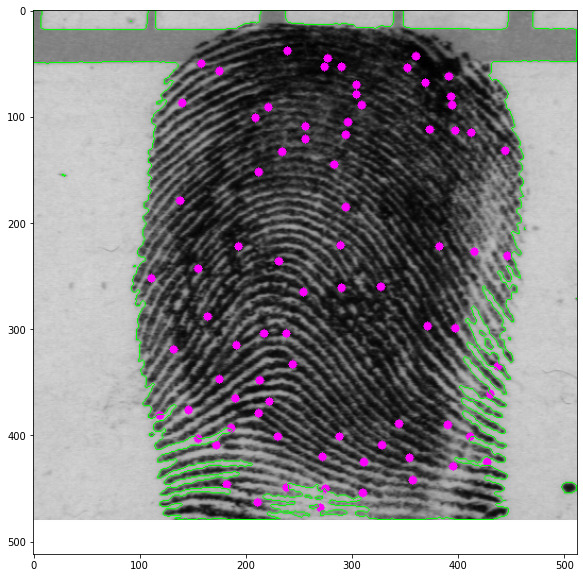

/mnt/d/Biometrics Project/python/venv/lib/python3.6/site-packages/ipykernel_launcher.py:63: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


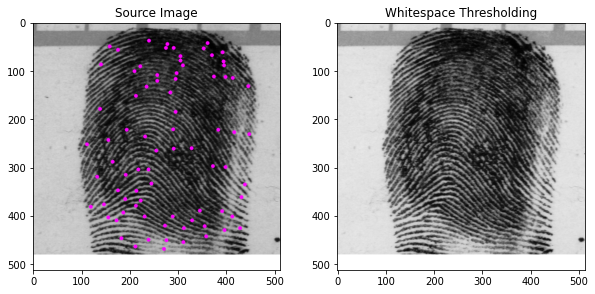

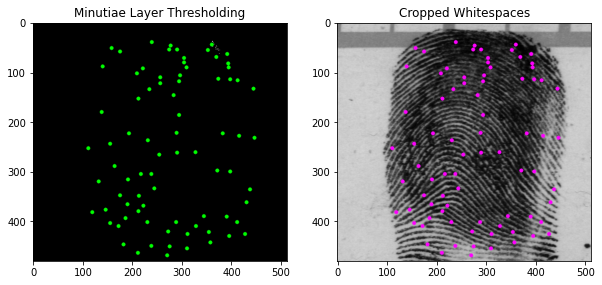

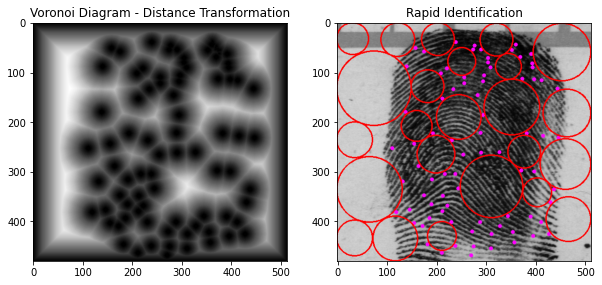

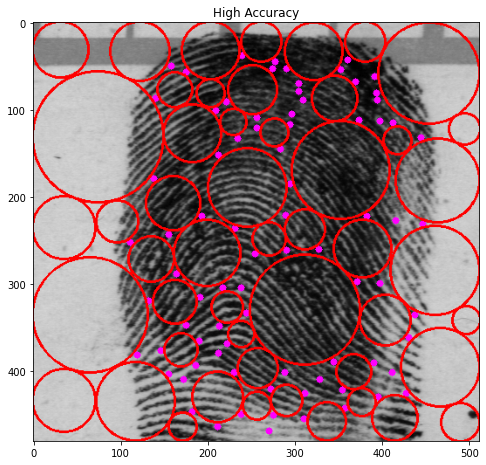

In [198]:
#file_names = open('/mnt/d/Biometrics Project/python/open_fields/file_names.txt')
#file_names = file_names.readlines()
total_dict_of_circles = {}
counter = 0
#for name in file_names:
name = 'f1638_04'
src = cv.imread('/mnt/d/Biometrics Project/python/open_fields/' + name + '.bmp')
file = open('/mnt/d/Biometrics Project/python/open_fields/'  + name + '.fet')
features = fet.parse(file.read())
for minutia in features.minutiae:
    # circle doesn't contain any features
    image = cv2.circle(src, (minutia.x,minutia.y), radius=4, color=(255, 0, 255), thickness=-1)

#src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0033_02_min.bmp")
src = image
gray_src = cv.imread('/mnt/d/Biometrics Project/python/open_fields/' + name + '.bmp', cv.IMREAD_GRAYSCALE)


blur = cv2.GaussianBlur(gray_src,(5,5),0) # apply blur for contour
ret, binary = cv2.threshold(blur,160,255,cv2.THRESH_BINARY_INV) # apply threshold to blur image
#plt.imshow(binary, cmap='Greys_r')
#plt.show()

ctrs, hier = cv.findContours(binary, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
img = cv.drawContours(src.copy(), ctrs, -1, (0,255,0), 1)
plt.imshow(img, cmap='Greys_r')
plt.show()


contours = ctrs
def find_if_close(cnt1,cnt2):
    row1,row2 = cnt1.shape[0],cnt2.shape[0]
    for i in range(row1):
        for j in range(row2):
            disty = np.linalg.norm(cnt1[i]-cnt2[j])
            if abs(disty) < 40 :
                return True
            elif i==row1-1 and j==row2-1:
                return False
            
            
LENGTH = len(ctrs)
status = np.zeros((LENGTH,1))

for i,cnt1 in enumerate(contours):
    x = i    
    if i != LENGTH-1:
        for j,cnt2 in enumerate(contours[i+1:]):
            x = x+1
            disty = find_if_close(cnt1,cnt2)
            if disty == True:
                val = min(status[i],status[x])
                status[x] = status[i] = val
            else:
                if status[x]==status[i]:
                    status[x] = i+1

unified = []
maximum = int(status.max())+1
for i in range(maximum):
    pos = np.where(status==i)[0]
    if pos.size != 0:
        cont = np.vstack(contours[i] for i in pos)
        hull = cv.convexHull(cont)
        unified.append(hull)

# img_1 = cv.drawContours(src.copy(),unified,-1,(0,255,0),1)
# plt.imshow(img_1, cmap='Greys_r')
# plt.show()


# x = cv2.minAreaRect(unified[0])
# box = cv.boxPoints(x)
# box = np.intp(box)
# #rect = src[y:y+h, x:x+w]
# img_1 = cv.drawContours(src, [box],-1,(0,255,0),1)
# plt.imshow(img_1, cmap='Greys_r')
# plt.show()




x, y, w, h = cv2.boundingRect(unified[0])
rect = src[y:y+h, x:x+w]






# #ctrs, hier = cv.findContours(gray_src, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
# gray = cv.cvtColor(src, cv.COLOR_RGB2GRAY) 
# gray = 255*(gray < 128).astype(np.uint8) # To invert the text to white
# coords = cv2.findNonZero(gray) # Find all non-zero points 
# x, y, w, h = cv2.boundingRect(coords) # Find minimum spanning bounding box
# rect = src[y:y+h, x:x+w] # Crop the image - note we do this on the original image


#img = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0010_01_min.bmp")

ret, im_th_1 = cv.threshold(rect, 0, 255, cv.THRESH_BINARY_INV)
img = im_th_1.copy()

#img = img_2.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold to binary and invert so background is white and xxx are black
thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)[1]
thresh = 255 - thresh

# add black border around threshold image to avoid corner being largest distance
thresh2 = cv2.copyMakeBorder(thresh, 1,1,1,1, cv2.BORDER_CONSTANT, (0))
h, w = thresh2.shape

# create zeros mask 2 pixels larger in each dimension
mask = np.zeros([h + 2, w + 2], np.uint8)

# apply distance transform
distimg = thresh2.copy()
distimg = cv2.distanceTransform(distimg, cv2.DIST_L2, 5)

# remove excess border
distimg = distimg[1:h-1, 1:w-1]
# plt.imshow(distimg)
# plt.show()
distimg_1 = distimg.copy()
tempy = distimg.copy()
# get max value and location in distance image
#min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)

# scale distance image for viewing
distimg = skimage.exposure.rescale_intensity(distimg, in_range='image', out_range=(0,255))
distimg = distimg.astype(np.uint8)

# draw circle on input
result = rect.copy()
high_result = rect.copy()
# centx = max_loc[0]
# centy = max_loc[1]
# radius = int(max_val)
# cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
# print('center x,y:', max_loc,'center radius:', max_val)

list_of_circles = []
max_loc = [1,1]
count = 0
while(count < 50):# and max_loc[1]!=-1
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)  
    adder = True
    if list_of_circles: # and max_loc[1]!=-1:
        for val in list_of_circles: # modifying list when using?
            # check if new point is far away from all older 
            # circles centres and distances)
            # check if circle is far away from other circles - current
            # check if circle doesn't include any minutae 
            if dist.euclidean((max_loc[0],max_loc[1]), 
                              # circle isn't near other circle
                              (val[0], val[1])) < (val[2]+int(max_val)): 
                    adder = False
                    break
#         for minutia in features.minutiae:
#             # circle doesn't contain any features
#             if dist.euclidean((minutia.x, minutia.y),           
#                          (max_loc[0],max_loc[1])) < (int(max_val)-2):
#                     adder = False
#                     break
    if(adder):
        count+=1
        centx = max_loc[0]
        centy = max_loc[1]
        radius = int(max_val)
        list_of_circles.append((max_loc[0], max_loc[1], radius))
        #cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
    if max_loc[1]!=-1:
        #distimg_1 = np.delete(distimg_1, max_loc[1], 0) 
        #distimg_1 = np.delete(distimg_1,
        #                     ( max_loc[0]*distimg_1.shape[1] + max_loc[1]))
        distimg_1[max_loc[1]][max_loc[0]] = 0

        
fl=0
for i in list_of_circles:
    cv2.circle(high_result, (i[0], i[1]), i[2], (255,0,0), 2)
    fl+=1
    if fl<25:
        cv2.circle(result, (i[0], i[1]), i[2], (255,0,0), 2)
    # plt.imshow(result)
    # plt.show()
    
    #total_dict_of_circles[name.split()[0]] = list_of_circles
    #cv2.imwrite('/mnt/d/Biometrics Project/python/open_fields/open/' + name.split()[0]+ '_min.bmp', result)
    #print(counter)
    #counter+=1


fig = plt.figure()
fig.add_subplot(2,2,1)
plt.title('Source Image')
plt.imshow(src)

fig.add_subplot(2,2,2)
plt.title('Whitespace Thresholding')
plt.imshow(gray_src, cmap='Greys_r')

plt.show()

fig = plt.figure()
fig.add_subplot(2,2,2)
plt.title('Cropped Whitespaces')
plt.imshow(rect, )

fig.add_subplot(2,2,1)
plt.title('Minutiae Layer Thresholding')
plt.imshow(im_th_1)
plt.show()

fig = plt.figure()
fig.add_subplot(2,2,1)
plt.title('Voronoi Diagram - Distance Transformation')
plt.imshow(tempy, cmap='Greys_r')

fig.add_subplot(2,2,2)
plt.title('Rapid Identification')
plt.imshow(result)
plt.show()


fig = plt.figure(figsize = (8,8))
#fig.add_subplot(2,2,1)
plt.title('High Accuracy')
plt.imshow(high_result)

plt.show()
plt.show()

/mnt/d/Biometrics Project/python/venv/lib/python3.6/site-packages/ipykernel_launcher.py:34: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


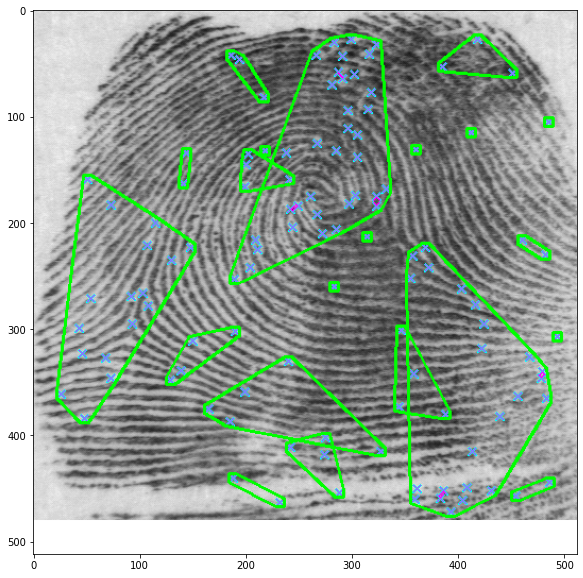

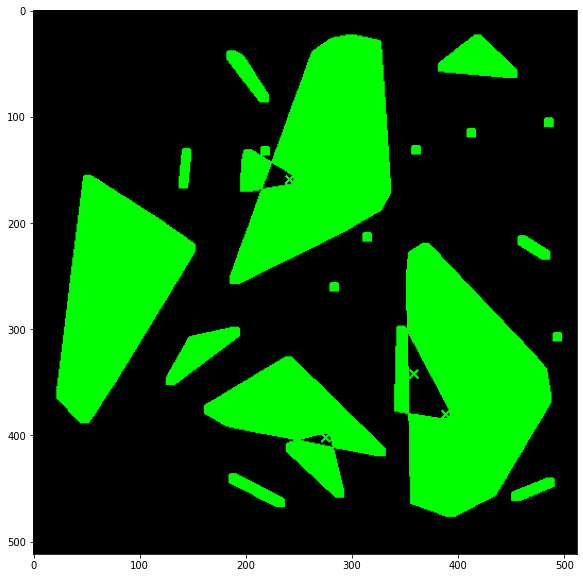

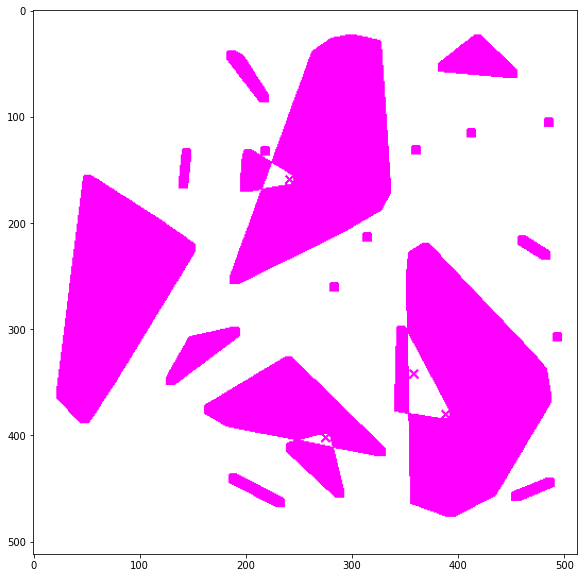

In [272]:
contours = ctrs
def find_if_close(cnt1,cnt2):
    row1,row2 = cnt1.shape[0],cnt2.shape[0]
    for i in range(row1):
        for j in range(row2):
            disty = np.linalg.norm(cnt1[i]-cnt2[j])
            if abs(disty) < 40 :
                return True
            elif i==row1-1 and j==row2-1:
                return False
            
            
LENGTH = len(ctrs)
status = np.zeros((LENGTH,1))

for i,cnt1 in enumerate(contours):
    x = i    
    if i != LENGTH-1:
        for j,cnt2 in enumerate(contours[i+1:]):
            x = x+1
            disty = find_if_close(cnt1,cnt2)
            if disty == True:
                val = min(status[i],status[x])
                status[x] = status[i] = val
            else:
                if status[x]==status[i]:
                    status[x] = i+1

unified = []
maximum = int(status.max())+1
for i in range(maximum):
    pos = np.where(status==i)[0]
    if pos.size != 0:
        cont = np.vstack(contours[i] for i in pos)
        hull = cv.convexHull(cont)
        unified.append(hull)

img_1 = cv.drawContours(img.copy(),unified,-1,(0,255,0),2)
#img_3 = cv.drawContours(thresh,unified,-1,255,-1)


img_2 = cv.drawContours(im_th_1.copy(), unified, -1, (0,255,0), -1)
plt.imshow(img_1)
plt.show()
plt.imshow(img_2)
plt.show()

ret, im_g = cv.threshold(img_2, 0, 255, cv.THRESH_BINARY_INV)
plt.imshow(im_g)
plt.show()


In [189]:
import cv2
from scipy.spatial import distance as dist
import fet

In [531]:
src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0011_02_min.bmp")

gray_src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0011_02_min.bmp", cv.IMREAD_GRAYSCALE)

#ctrs, hier = cv.findContours(gray_src, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
gray = cv.cvtColor(src, cv.COLOR_RGB2GRAY) 
gray = 255*(gray < 128).astype(np.uint8) # To invert the text to white
coords = cv2.findNonZero(gray) # Find all non-zero points 
x, y, w, h = cv2.boundingRect(coords) # Find minimum spanning bounding box
rect = src[y:y+h, x:x+w] # Crop the image - note we do this on the original image


file = open('/mnt/d/Biometrics Project/python/open_fields_examples/f0011_02.fet')
features = fet.parse(file.read())

#img = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0010_01_min.bmp")

ret, im_th_1 = cv.threshold(rect, 0, 255, cv.THRESH_BINARY_INV)
img = im_th_1.copy()

#img = img_2.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold to binary and invert so background is white and xxx are black
thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)[1]
thresh = 255 - thresh

# add black border around threshold image to avoid corner being largest distance
thresh2 = cv2.copyMakeBorder(thresh, 1,1,1,1, cv2.BORDER_CONSTANT, (0))
h, w = thresh2.shape

# create zeros mask 2 pixels larger in each dimension
mask = np.zeros([h + 2, w + 2], np.uint8)

# apply distance transform
distimg = thresh2.copy()
distimg = cv2.distanceTransform(distimg, cv2.DIST_L2, 5)

# remove excess border
distimg = distimg[1:h-1, 1:w-1]
# plt.imshow(distimg)
# plt.show()
distimg_1 = distimg.copy()
tempy = distimg.copy()
# get max value and location in distance image
#min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)

# scale distance image for viewing
distimg = skimage.exposure.rescale_intensity(distimg, in_range='image', out_range=(0,255))
distimg = distimg.astype(np.uint8)

# draw circle on input
result = rect.copy()

# centx = max_loc[0]
# centy = max_loc[1]
# radius = int(max_val)
# cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
# print('center x,y:', max_loc,'center radius:', max_val)

list_of_circles = []
max_loc = [1,1]
count = 0
while(count < 200): # and max_loc[1]!=-1
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)  
    adder = True
    if list_of_circles: # and max_loc[1]!=-1:
        for val in list_of_circles: # modifying list when using?
            # check if new point is far away from all older 
            # circles centres and distances)
            # check if circle is far away from other circles - current
            # check if circle doesn't include any minutae 
            if dist.euclidean((max_loc[0],max_loc[1]), 
                              # circle isn't near other circle
                              (val[0], val[1])) < (val[2]+int(max_val)): 
                    adder = False
                    break
#         for minutia in features.minutiae:
#             # circle doesn't contain any features
#             if dist.euclidean((minutia.x, minutia.y),           
#                          (max_loc[0],max_loc[1])) < (int(max_val)-2):
#                     adder = False
#                     break
    if(adder):
        count+=1
        centx = max_loc[0]
        centy = max_loc[1]
        radius = int(max_val)
        list_of_circles.append((max_loc[0], max_loc[1], radius))
        #cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
    if max_loc[1]!=-1:
        #distimg_1 = np.delete(distimg_1, max_loc[1], 0) 
        #distimg_1 = np.delete(distimg_1,
        #                     ( max_loc[0]*distimg_1.shape[1] + max_loc[1]))
        distimg_1[max_loc[1]][max_loc[0]] = 0
        
for i in list_of_circles:
    cv2.circle(result, (i[0], i[1]), i[2], (255,0,0), 2)



<Figure size 576x576 with 0 Axes>

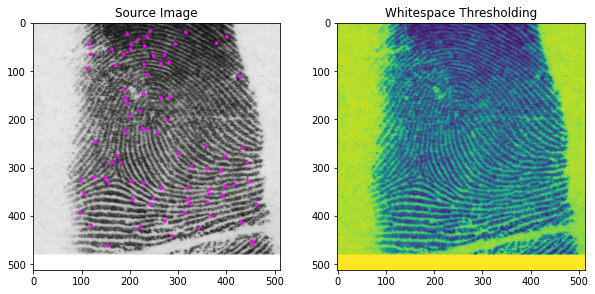

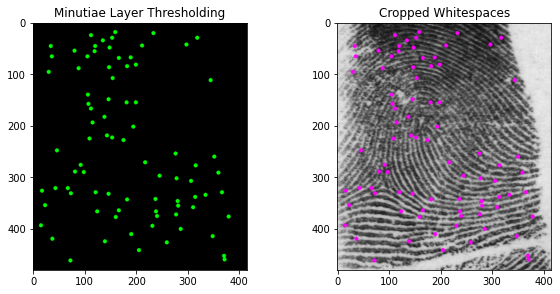

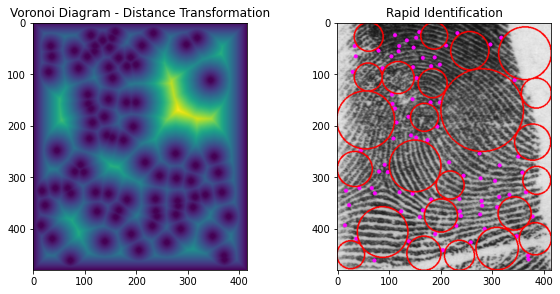

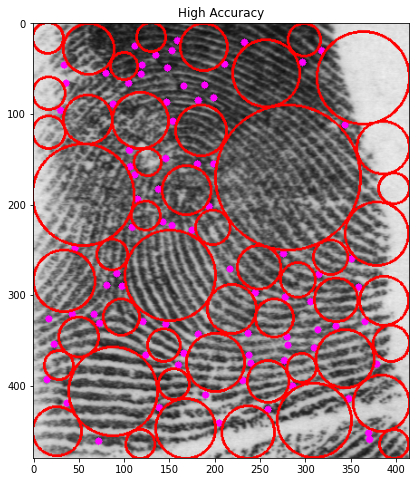

In [98]:
#file_names = open('/mnt/d/Biometrics Project/python/open_fields/file_names.txt')
#file_names = file_names.readlines()
total_dict_of_circles = {}
counter = 0
#for name in file_names:
name = 'f0033_02'
src = cv.imread('/mnt/d/Biometrics Project/python/open_fields/' + name + '.bmp')
file = open('/mnt/d/Biometrics Project/python/open_fields/'  + name + '.fet')
features = fet.parse(file.read())
for minutia in features.minutiae:
    # circle doesn't contain any features
    image = cv2.circle(src, (minutia.x,minutia.y), radius=4, color=(255, 0, 255), thickness=-1)

#src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0033_02_min.bmp")
src = image
gray_src = cv.imread('/mnt/d/Biometrics Project/python/open_fields/' + name + '.bmp', cv.IMREAD_GRAYSCALE)

#ctrs, hier = cv.findContours(gray_src, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
gray = cv.cvtColor(src, cv.COLOR_RGB2GRAY) 
gray = 255*(gray < 128).astype(np.uint8) # To invert the text to white
coords = cv2.findNonZero(gray) # Find all non-zero points 
x, y, w, h = cv2.boundingRect(coords) # Find minimum spanning bounding box
rect = src[y:y+h, x:x+w] # Crop the image - note we do this on the original image


#img = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0010_01_min.bmp")

ret, im_th_1 = cv.threshold(rect, 0, 255, cv.THRESH_BINARY_INV)
img = im_th_1.copy()

#img = img_2.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold to binary and invert so background is white and xxx are black
thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)[1]
thresh = 255 - thresh

# add black border around threshold image to avoid corner being largest distance
thresh2 = cv2.copyMakeBorder(thresh, 1,1,1,1, cv2.BORDER_CONSTANT, (0))
h, w = thresh2.shape

# create zeros mask 2 pixels larger in each dimension
mask = np.zeros([h + 2, w + 2], np.uint8)

# apply distance transform
distimg = thresh2.copy()
distimg = cv2.distanceTransform(distimg, cv2.DIST_L2, 5)

# remove excess border
distimg = distimg[1:h-1, 1:w-1]
# plt.imshow(distimg)
# plt.show()
distimg_1 = distimg.copy()
tempy = distimg.copy()
# get max value and location in distance image
#min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)

# scale distance image for viewing
distimg = skimage.exposure.rescale_intensity(distimg, in_range='image', out_range=(0,255))
distimg = distimg.astype(np.uint8)

# draw circle on input
result = rect.copy()
high_result = rect.copy()
# centx = max_loc[0]
# centy = max_loc[1]
# radius = int(max_val)
# cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
# print('center x,y:', max_loc,'center radius:', max_val)

list_of_circles = []
max_loc = [1,1]
count = 0
while(count < 50):# and max_loc[1]!=-1
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)  
    adder = True
    if list_of_circles: # and max_loc[1]!=-1:
        for val in list_of_circles: # modifying list when using?
            # check if new point is far away from all older 
            # circles centres and distances)
            # check if circle is far away from other circles - current
            # check if circle doesn't include any minutae 
            if dist.euclidean((max_loc[0],max_loc[1]), 
                              # circle isn't near other circle
                              (val[0], val[1])) < (val[2]+int(max_val)): 
                    adder = False
                    break
#         for minutia in features.minutiae:
#             # circle doesn't contain any features
#             if dist.euclidean((minutia.x, minutia.y),           
#                          (max_loc[0],max_loc[1])) < (int(max_val)-2):
#                     adder = False
#                     break
    if(adder):
        count+=1
        centx = max_loc[0]
        centy = max_loc[1]
        radius = int(max_val)
        list_of_circles.append((max_loc[0], max_loc[1], radius))
        #cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
    if max_loc[1]!=-1:
        #distimg_1 = np.delete(distimg_1, max_loc[1], 0) 
        #distimg_1 = np.delete(distimg_1,
        #                     ( max_loc[0]*distimg_1.shape[1] + max_loc[1]))
        distimg_1[max_loc[1]][max_loc[0]] = 0

        
fl=0
for i in list_of_circles:
    cv2.circle(high_result, (i[0], i[1]), i[2], (255,0,0), 2)
    fl+=1
    if fl<25:
        cv2.circle(result, (i[0], i[1]), i[2], (255,0,0), 2)
    # plt.imshow(result)
    # plt.show()
    
    #total_dict_of_circles[name.split()[0]] = list_of_circles
    #cv2.imwrite('/mnt/d/Biometrics Project/python/open_fields/open/' + name.split()[0]+ '_min.bmp', result)
    #print(counter)
    #counter+=1

plt.figure(figsize = (8,8))
fig = plt.figure()

fig.add_subplot(2,2,1)
plt.title('Source Image')
plt.imshow(src)

fig.add_subplot(2,2,2)
plt.title('Whitespace Thresholding')
plt.imshow(gray_src)

plt.show()

fig = plt.figure()
fig.add_subplot(2,2,2)
plt.title('Cropped Whitespaces')
plt.imshow(rect)

fig.add_subplot(2,2,1)
plt.title('Minutiae Layer Thresholding')
plt.imshow(im_th_1)
plt.show()

fig = plt.figure()
fig.add_subplot(2,2,1)
plt.title('Voronoi Diagram - Distance Transformation')
plt.imshow(tempy)

fig.add_subplot(2,2,2)
plt.title('Rapid Identification')
plt.imshow(result)
plt.show()


fig = plt.figure(figsize = (8,8))
#fig.add_subplot(2,2,1)
plt.title('High Accuracy')
plt.imshow(high_result)

plt.show()
plt.show()

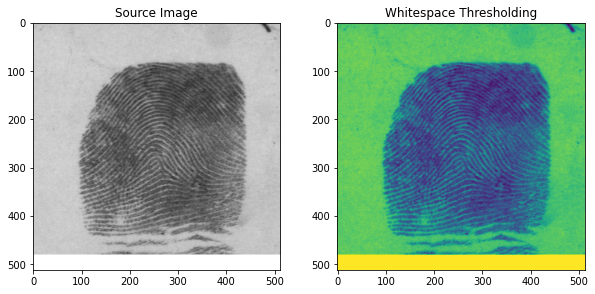

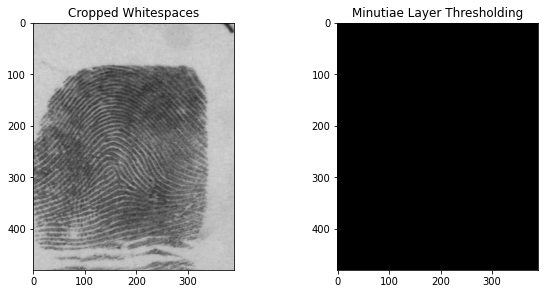

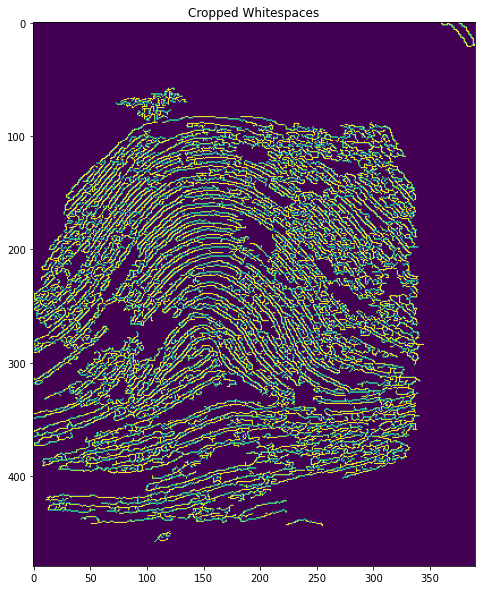

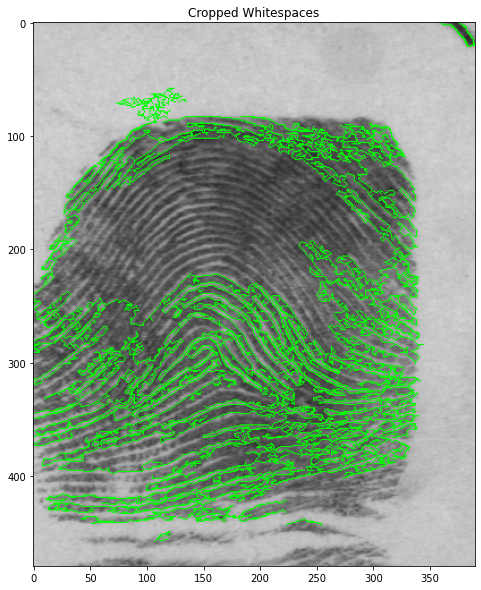

In [84]:
#file_names = open('/mnt/d/Biometrics Project/python/open_fields/file_names.txt')
#file_names = file_names.readlines()
total_dict_of_circles = {}
counter = 0
#for name in file_names:
name = 'f0008_10'
src = cv.imread('/mnt/d/Biometrics Project/python/open_fields/' + name + '.bmp')
file = open('/mnt/d/Biometrics Project/python/open_fields/'  + name + '.fet')
features = fet.parse(file.read())

#for minutia in features.minutiae:
    # circle doesn't contain any features
    #image = cv2.circle(src, (minutia.x,minutia.y), radius=4, color=(255, 0, 255), thickness=-1)

#src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0033_02_min.bmp")
#src = image
gray_src = cv.imread('/mnt/d/Biometrics Project/python/open_fields/' + name + '.bmp', cv.IMREAD_GRAYSCALE)


#img = cv.drawContours(src.copy(), ctrs, -1, (0,255,255), 1)



#ctrs, hier = cv.findContours(gray_src, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
gray = cv.cvtColor(src, cv.COLOR_RGB2GRAY) 
gray = 255*(gray < 96).astype(np.uint8) # To invert the text to white
coords = cv2.findNonZero(gray) # Find all non-zero points 

#print(coords)
#print(len(coords))


x, y, w, h = cv2.boundingRect(coords) # Find minimum spanning bounding box
rect = src[y:y+h, x:x+w] # Crop the image - note we do this on the original image

rectz = rect.copy()


edges = cv2.Canny(rect, 5, 355)
ctrs, hier = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
contours_poly = [None]*len(ctrs)
for i, c in enumerate(ctrs):
    contours_poly[i] = cv.approxPolyDP(c, 1, True)

for i in range(len(ctrs)):
    cv.drawContours(rectz, contours_poly, i, (0,255,0),1) 

#img = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0010_01_min.bmp")

ret, im_th_1 = cv.threshold(rect, 0, 255, cv.THRESH_BINARY_INV)
img = im_th_1.copy()





fig = plt.figure()
fig.add_subplot(2,2,1)
plt.title('Source Image')
plt.imshow(src)

fig.add_subplot(2,2,2)
plt.title('Whitespace Thresholding')
plt.imshow(gray_src)

plt.show()

fig = plt.figure()
fig.add_subplot(2,2,1)
plt.title('Cropped Whitespaces')
plt.imshow(rect)

fig.add_subplot(2,2,2)
plt.title('Minutiae Layer Thresholding')
plt.imshow(im_th_1)
plt.show()


fig = plt.figure()
fig.add_subplot(1,1,1)
plt.title('Cropped Whitespaces')
plt.imshow(edges)
plt.show()

fig = plt.figure()
fig.add_subplot(1,1,1)
plt.title('Cropped Whitespaces')
plt.imshow(rectz)
plt.show()





In [34]:
%%html
<style>
#notebook-container {
    width: 90%;
    background-color: #EEE
}

.code_cell {
   flex-direction: row !important;
}

.code_cell .output_wrapper {
    width: 50%;
    background-color: #FFF
}

.code_cell .input {
    width: 50%;
    background-color: #FFF
}
</style>

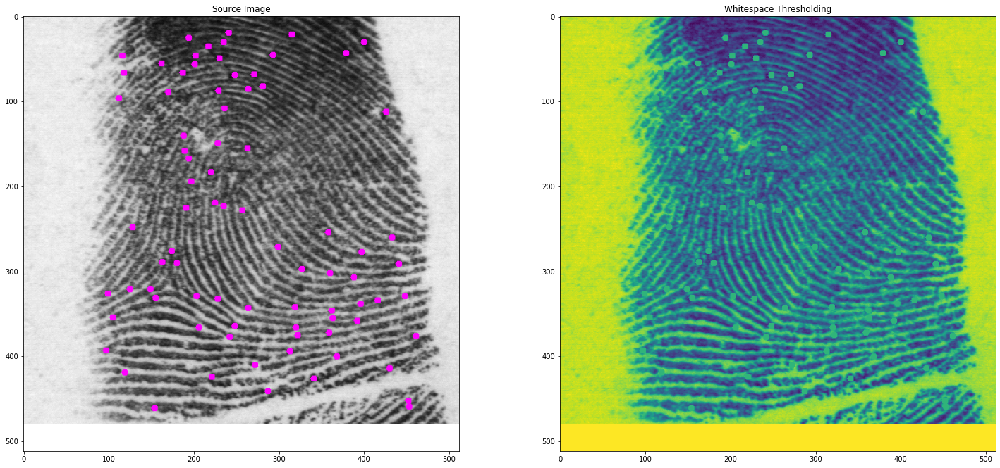

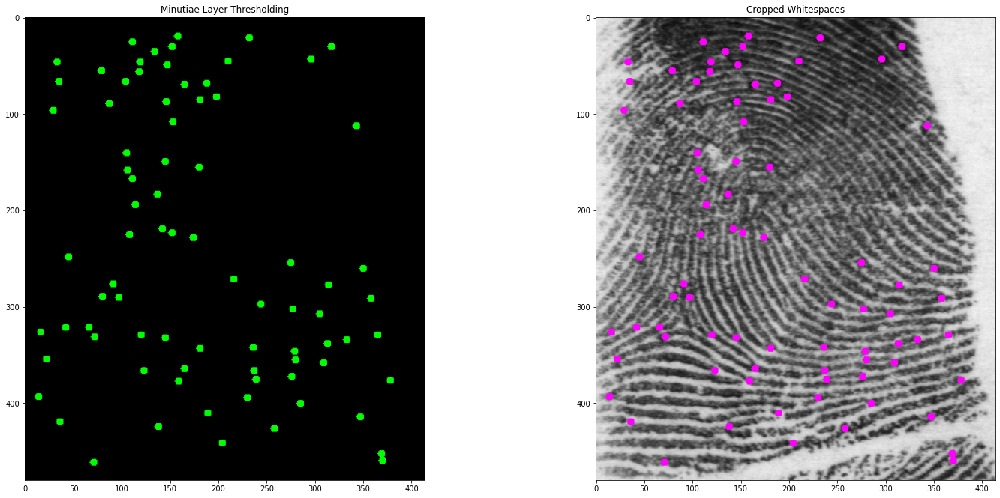

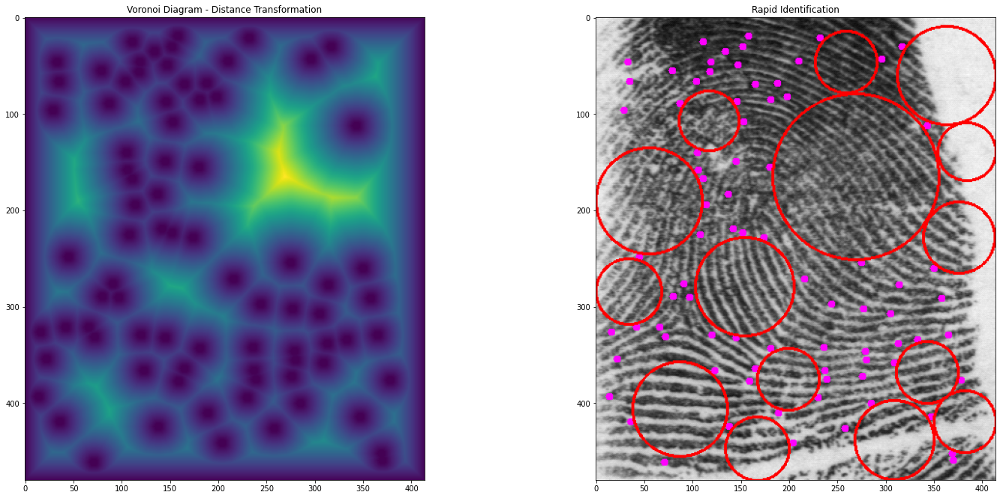

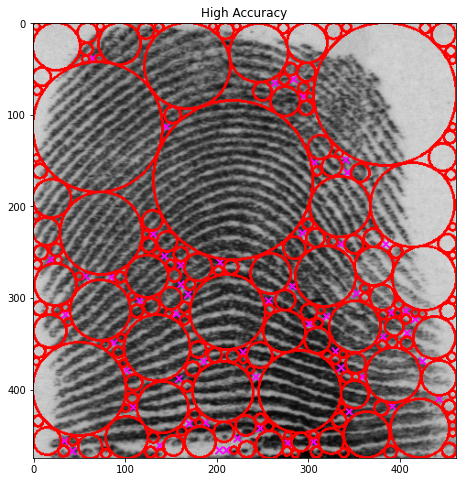

In [545]:

#plt.figure(figsize = (8,8))
fig = plt.figure()

fig.add_subplot(2,2,1)
plt.title('Source Image')
plt.imshow(src)

fig.add_subplot(2,2,2)
plt.title('Whitespace Thresholding')
plt.imshow(gray_src)

plt.show()

fig = plt.figure()
fig.add_subplot(2,2,2)
plt.title('Cropped Whitespaces')
plt.imshow(rect)

fig.add_subplot(2,2,1)
plt.title('Minutiae Layer Thresholding')
plt.imshow(im_th_1)
plt.show()

fig = plt.figure()
fig.add_subplot(2,2,1)
plt.title('Voronoi Diagram - Distance Transformation')
plt.imshow(tempy)

fig.add_subplot(2,2,2)
plt.title('Rapid Identification')
plt.imshow(result)
plt.show()


fig = plt.figure(figsize = (8,8))
#fig.add_subplot(2,2,1)
plt.title('High Accuracy')
plt.imshow(high_result)

plt.show()

In [595]:
file_names = open('/mnt/d/Biometrics Project/python/open_fields/file_names.txt')
file_names = file_names.readlines()
total_dict_of_circles = {}
counter = 0
for name in file_names:
    src = cv.imread('/mnt/d/Biometrics Project/python/open_fields/' + name.split()[0] + '.bmp')
    file = open('/mnt/d/Biometrics Project/python/open_fields/'  + name.split()[0] + '.fet')
    features = fet.parse(file.read())
    for minutia in features.minutiae:
        # circle doesn't contain any features
        image = cv2.circle(src, (minutia.x,minutia.y), radius=4, color=(255, 0, 255), thickness=-1)

    #src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0033_02_min.bmp")
    src = image
    #gray_src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0001_01.bmp", cv.IMREAD_GRAYSCALE)

    #ctrs, hier = cv.findContours(gray_src, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    gray = cv.cvtColor(src, cv.COLOR_RGB2GRAY) 
    gray = 255*(gray < 128).astype(np.uint8) # To invert the text to white
    coords = cv2.findNonZero(gray) # Find all non-zero points 
    x, y, w, h = cv2.boundingRect(coords) # Find minimum spanning bounding box
    rect = src[y:y+h, x:x+w] # Crop the image - note we do this on the original image


    #img = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0010_01_min.bmp")

    ret, im_th_1 = cv.threshold(rect, 0, 255, cv.THRESH_BINARY_INV)
    img = im_th_1.copy()

    #img = img_2.copy()

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # threshold to binary and invert so background is white and xxx are black
    thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)[1]
    thresh = 255 - thresh

    # add black border around threshold image to avoid corner being largest distance
    thresh2 = cv2.copyMakeBorder(thresh, 1,1,1,1, cv2.BORDER_CONSTANT, (0))
    h, w = thresh2.shape

    # create zeros mask 2 pixels larger in each dimension
    mask = np.zeros([h + 2, w + 2], np.uint8)

    # apply distance transform
    distimg = thresh2.copy()
    distimg = cv2.distanceTransform(distimg, cv2.DIST_L2, 5)

    # remove excess border
    distimg = distimg[1:h-1, 1:w-1]
    # plt.imshow(distimg)
    # plt.show()
    distimg_1 = distimg.copy()
    tempy = distimg.copy()
    # get max value and location in distance image
    #min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)

    # scale distance image for viewing
    distimg = skimage.exposure.rescale_intensity(distimg, in_range='image', out_range=(0,255))
    distimg = distimg.astype(np.uint8)

    # draw circle on input
    result = rect.copy()

    # centx = max_loc[0]
    # centy = max_loc[1]
    # radius = int(max_val)
    # cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
    # print('center x,y:', max_loc,'center radius:', max_val)

    list_of_circles = []
    max_loc = [1,1]
    count = 0
    while(count < 25 ):# and max_loc[1]!=-1
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)  
        adder = True
        if list_of_circles: # and max_loc[1]!=-1:
            for val in list_of_circles: # modifying list when using?
                # check if new point is far away from all older 
                # circles centres and distances)
                # check if circle is far away from other circles - current
                # check if circle doesn't include any minutae 
                if dist.euclidean((max_loc[0],max_loc[1]), 
                                  # circle isn't near other circle
                                  (val[0], val[1])) < (val[2]+int(max_val)): 
                        adder = False
                        break
    #         for minutia in features.minutiae:
    #             # circle doesn't contain any features
    #             if dist.euclidean((minutia.x, minutia.y),           
    #                          (max_loc[0],max_loc[1])) < (int(max_val)-2):
    #                     adder = False
    #                     break
        if(adder):
            count+=1
            centx = max_loc[0]
            centy = max_loc[1]
            radius = int(max_val)
            list_of_circles.append((max_loc[0], max_loc[1], radius))
            #cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
        if max_loc[1]!=-1:
            #distimg_1 = np.delete(distimg_1, max_loc[1], 0) 
            #distimg_1 = np.delete(distimg_1,
            #                     ( max_loc[0]*distimg_1.shape[1] + max_loc[1]))
            distimg_1[max_loc[1]][max_loc[0]] = 0

    for i in list_of_circles:
        cv2.circle(result, (i[0], i[1]), i[2], (255,0,0), 2)
    # plt.imshow(result)
    # plt.show()
    
    total_dict_of_circles[name.split()[0]] = list_of_circles
    cv2.imwrite('/mnt/d/Biometrics Project/python/open_fields/open/' + name.split()[0]+ '_min.bmp', result)
    print(counter)
    counter+=1
#     fig = plt.figure()

#     fig.add_subplot(2,2,1)
#     plt.title('Source Image')
#     plt.imshow(src)

#     fig.add_subplot(2,2,2)
#     plt.title('Whitespace Thresholding')
#     plt.imshow(gray_src)

#     plt.show()

#     fig = plt.figure()
#     fig.add_subplot(2,2,2)
#     plt.title('Cropped Whitespaces')
#     plt.imshow(rect)

#     fig.add_subplot(2,2,1)
#     plt.title('Minutiae Layer Thresholding')
#     plt.imshow(im_th_1)
#     plt.show()

#     fig = plt.figure()
#     fig.add_subplot(2,2,1)
#     plt.title('Voronoi Diagram - Distance Transformation')
#     plt.imshow(tempy)

#     fig.add_subplot(2,2,2)
#     plt.title('Rapid Identification')
#     plt.imshow(result)
#     plt.show()

with open('/mnt/d/Biometrics Project/python/open_fields_examples/open/open_fields.txt', 'w') as outfile:
    json.dump(total_dict_of_circles, outfile)
print(total_dict_of_circles)

#plt.figure(figsize = (8,8))



# fig = plt.figure(figsize = (8,8))
# #fig.add_subplot(2,2,1)
# plt.title('High Accuracy')
# plt.imshow(high_result)

# plt.show()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
{'F0001_01': [(72, 113, 72), (444, 66, 67), (288, 379, 51), (50, 284, 50), (465, 179, 47), (129, 403, 46), (329, 278, 41), (282, 40, 41), (211, 185, 38), (474, 354, 37), (33, 414, 33), (479, 423, 32), (388, 318, 30), (317, 109, 30), (125, 28, 28), (374, 451, 28), (28, 210, 27), (231, 325, 27), (25, 25, 2

In [202]:
file_names = open('/mnt/d/Biometrics Project/python/open_fields/file_names.txt')
file_names = file_names.readlines()
total_dict_of_circles = {}
counter = 0
for name in file_names:
    src = cv.imread('/mnt/d/Biometrics Project/python/open_fields/' + name.split()[0] + '.bmp')
    file = open('/mnt/d/Biometrics Project/python/open_fields/'  + name.split()[0] + '.fet')
    features = fet.parse(file.read())
    for minutia in features.minutiae:
        # circle doesn't contain any features
        image = cv2.circle(src, (minutia.x,minutia.y), radius=4, color=(255, 0, 255), thickness=-1)

    #src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0033_02_min.bmp")
    src = image
    #gray_src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0001_01.bmp", cv.IMREAD_GRAYSCALE)


    blur = cv2.GaussianBlur(gray_src,(5,5),0) # apply blur for contour
    ret, binary = cv2.threshold(blur,160,255,cv2.THRESH_BINARY_INV) # apply threshold to blur image
    #plt.imshow(binary, cmap='Greys_r')
    #plt.show()

    ctrs, hier = cv.findContours(binary, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)


    contours = ctrs
    def find_if_close(cnt1,cnt2):
        row1,row2 = cnt1.shape[0],cnt2.shape[0]
        for i in range(row1):
            for j in range(row2):
                disty = np.linalg.norm(cnt1[i]-cnt2[j])
                if abs(disty) < 30 :
                    return True
                elif i==row1-1 and j==row2-1:
                    return False


    LENGTH = len(ctrs)
    status = np.zeros((LENGTH,1))

    for i,cnt1 in enumerate(contours):
        x = i    
        if i != LENGTH-1:
            for j,cnt2 in enumerate(contours[i+1:]):
                x = x+1
                disty = find_if_close(cnt1,cnt2)
                if disty == True:
                    val = min(status[i],status[x])
                    status[x] = status[i] = val
                else:
                    if status[x]==status[i]:
                        status[x] = i+1

    unified = []
    maximum = int(status.max())+1
    for i in range(maximum):
        pos = np.where(status==i)[0]
        if pos.size != 0:
            cont = np.vstack(contours[i] for i in pos)
            hull = cv.convexHull(cont)
            unified.append(hull)



    x, y, w, h = cv2.boundingRect(unified[0])
    rect = src[y:y+h, x:x+w]

    #img = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0010_01_min.bmp")

    ret, im_th_1 = cv.threshold(rect, 0, 255, cv.THRESH_BINARY_INV)
    img = im_th_1.copy()

    #img = img_2.copy()

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # threshold to binary and invert so background is white and xxx are black
    thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)[1]
    thresh = 255 - thresh

    # add black border around threshold image to avoid corner being largest distance
    thresh2 = cv2.copyMakeBorder(thresh, 1,1,1,1, cv2.BORDER_CONSTANT, (0))
    h, w = thresh2.shape

    # create zeros mask 2 pixels larger in each dimension
    mask = np.zeros([h + 2, w + 2], np.uint8)

    # apply distance transform
    distimg = thresh2.copy()
    distimg = cv2.distanceTransform(distimg, cv2.DIST_L2, 5)

    # remove excess border
    distimg = distimg[1:h-1, 1:w-1]
    # plt.imshow(distimg)
    # plt.show()
    distimg_1 = distimg.copy()
    tempy = distimg.copy()
    # get max value and location in distance image
    #min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)

    # scale distance image for viewing
    distimg = skimage.exposure.rescale_intensity(distimg, in_range='image', out_range=(0,255))
    distimg = distimg.astype(np.uint8)

    # draw circle on input
    result = rect.copy()

    # centx = max_loc[0]
    # centy = max_loc[1]
    # radius = int(max_val)
    # cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
    # print('center x,y:', max_loc,'center radius:', max_val)

    list_of_circles = []
    max_loc = [1,1]
    count = 0
    while(count < 25 ):# and max_loc[1]!=-1
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)  
        adder = True
        if list_of_circles: # and max_loc[1]!=-1:
            for val in list_of_circles: # modifying list when using?
                # check if new point is far away from all older 
                # circles centres and distances)
                # check if circle is far away from other circles - current
                # check if circle doesn't include any minutae 
                if dist.euclidean((max_loc[0],max_loc[1]), 
                                  # circle isn't near other circle
                                  (val[0], val[1])) < (val[2]+int(max_val)): 
                        adder = False
                        break
    #         for minutia in features.minutiae:
    #             # circle doesn't contain any features
    #             if dist.euclidean((minutia.x, minutia.y),           
    #                          (max_loc[0],max_loc[1])) < (int(max_val)-2):
    #                     adder = False
    #                     break
        if(adder):
            count+=1
            centx = max_loc[0]
            centy = max_loc[1]
            radius = int(max_val)
            list_of_circles.append((max_loc[0], max_loc[1], radius))
            #cv2.circle(result, (centx, centy), radius, (255,0,255), 1)
        if max_loc[1]!=-1:
            #distimg_1 = np.delete(distimg_1, max_loc[1], 0) 
            #distimg_1 = np.delete(distimg_1,
            #                     ( max_loc[0]*distimg_1.shape[1] + max_loc[1]))
            distimg_1[max_loc[1]][max_loc[0]] = 0

    for i in list_of_circles:
        cv2.circle(result, (i[0], i[1]), i[2], (255,0,0), 2)
    # plt.imshow(result)
    # plt.show()

    total_dict_of_circles[name.split()[0]] = list_of_circles
    cv2.imwrite('/mnt/d/Biometrics Project/python/open_fields/open/' + name.split()[0]+ '_of.bmp', result)
    print(counter)
    counter+=1
#     fig = plt.figure()

#     fig.add_subplot(2,2,1)
#     plt.title('Source Image')
#     plt.imshow(src)

#     fig.add_subplot(2,2,2)
#     plt.title('Whitespace Thresholding')
#     plt.imshow(gray_src)

#     plt.show()

#     fig = plt.figure()
#     fig.add_subplot(2,2,2)
#     plt.title('Cropped Whitespaces')
#     plt.imshow(rect)

#     fig.add_subplot(2,2,1)
#     plt.title('Minutiae Layer Thresholding')
#     plt.imshow(im_th_1)
#     plt.show()

#     fig = plt.figure()
#     fig.add_subplot(2,2,1)
#     plt.title('Voronoi Diagram - Distance Transformation')
#     plt.imshow(tempy)

#     fig.add_subplot(2,2,2)
#     plt.title('Rapid Identification')
#     plt.imshow(result)
#     plt.show()

with open('/mnt/d/Biometrics Project/python/open_fields/open/open_fields_of.txt', 'w') as outfile:
    json.dump(total_dict_of_circles, outfile)
#print(total_dict_of_circles)

#plt.figure(figsize = (8,8))



# fig = plt.figure(figsize = (8,8))
# #fig.add_subplot(2,2,1)
# plt.title('High Accuracy')
# plt.imshow(high_result)

# plt.show()




/mnt/d/Biometrics Project/python/venv/lib/python3.6/site-packages/ipykernel_launcher.py:59: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

KeyboardInterrupt: 

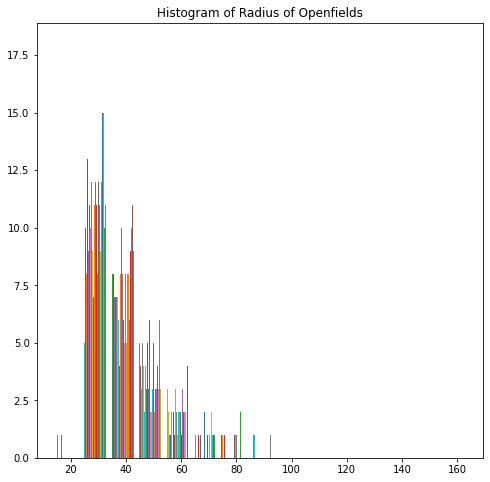

In [628]:

#print(total_dict_of_circles)

file = open('/mnt/d/Biometrics Project/python/open_fields_examples/open/open_fields.txt')
total_dict_of_circles = json.load(file)


fp_circles = []

for fp in total_dict_of_circles:
    fp_circles.append([_[2] for _ in total_dict_of_circles[fp]])

plt.figure(figsize = (8,8))
plt.hist(fp_circles, bins=15)
plt.title('Histogram of Radius of Openfields - 15 Bins')
plt.show()




#y = np.array(fp_circles)
#print(y.mean(axis=0))
#for i in fp_circles[0]:
#    print([x[2] for x in fp_circles[0]])

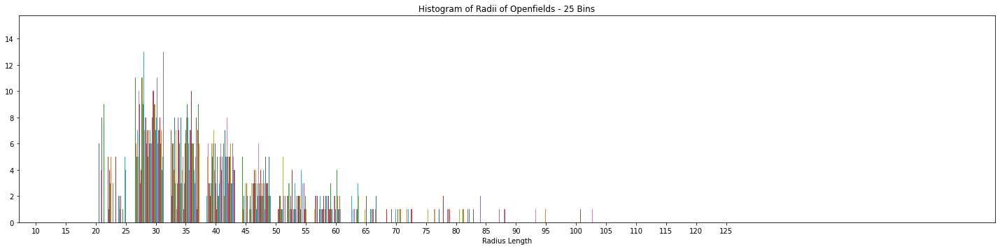

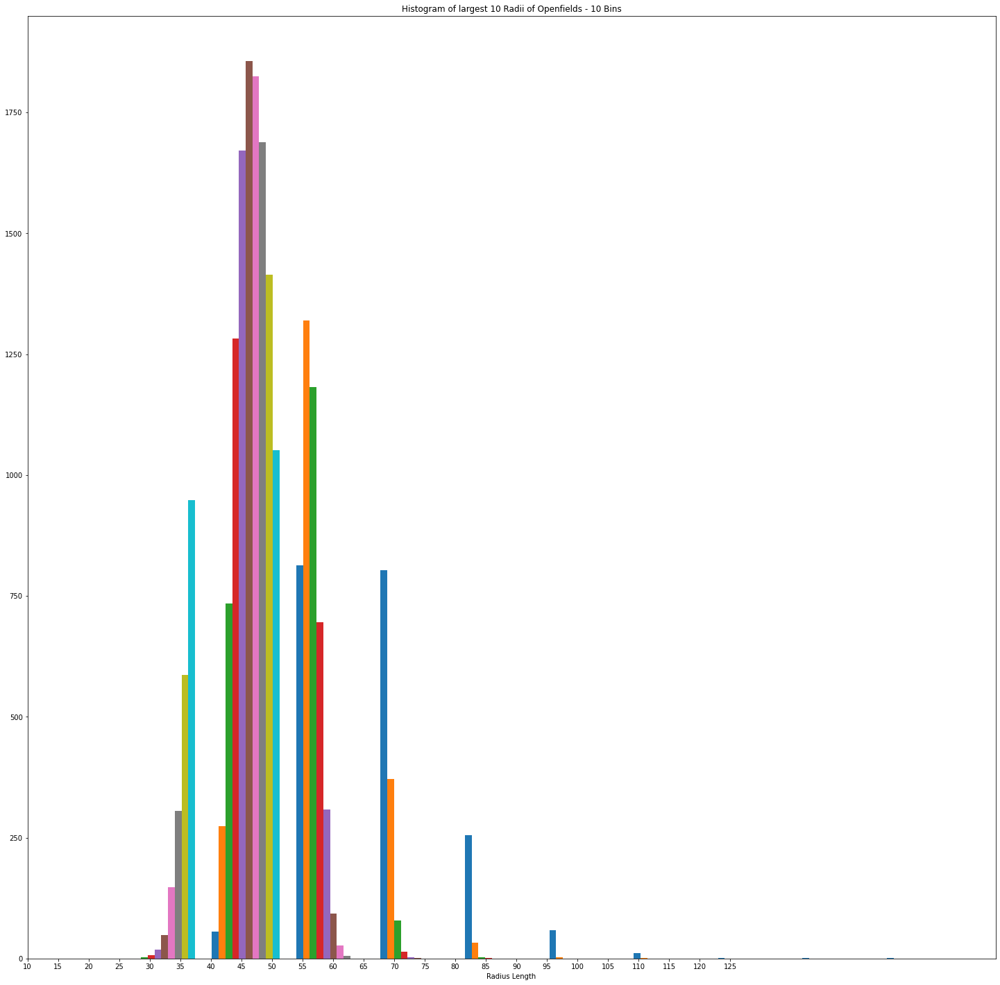

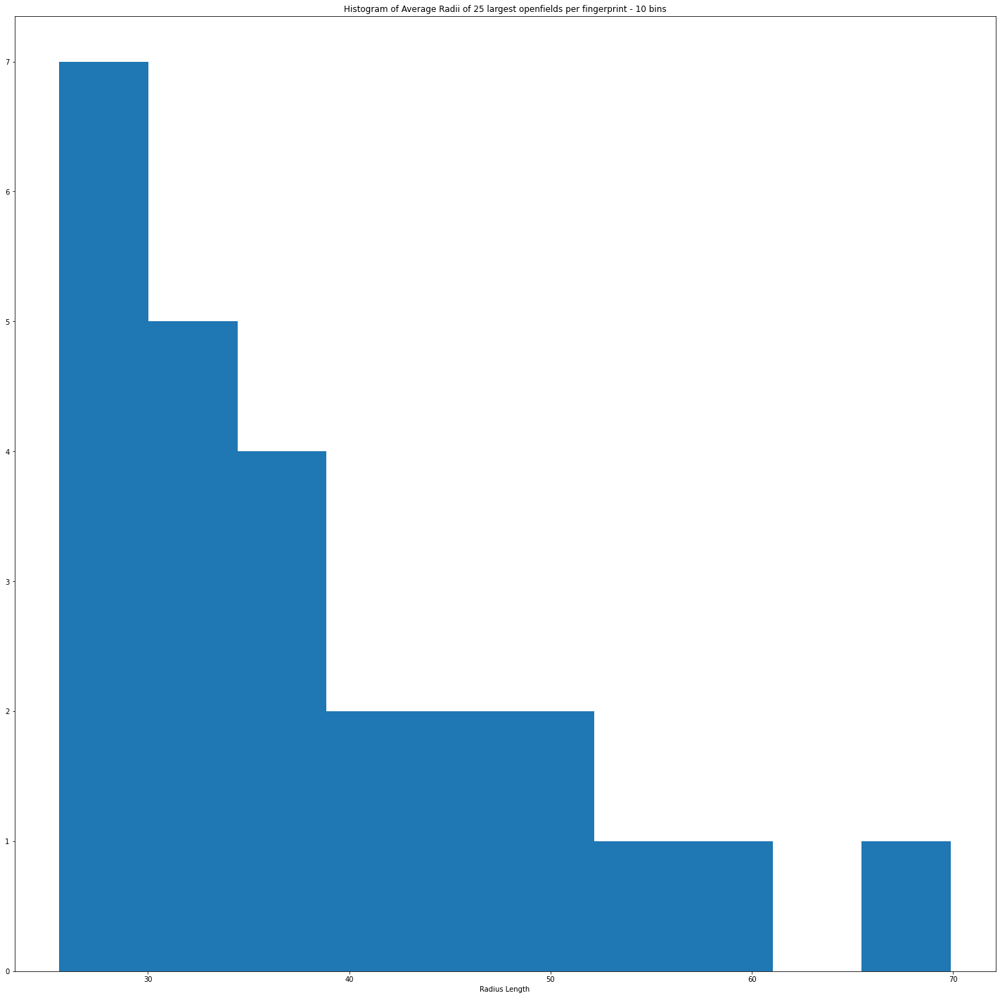

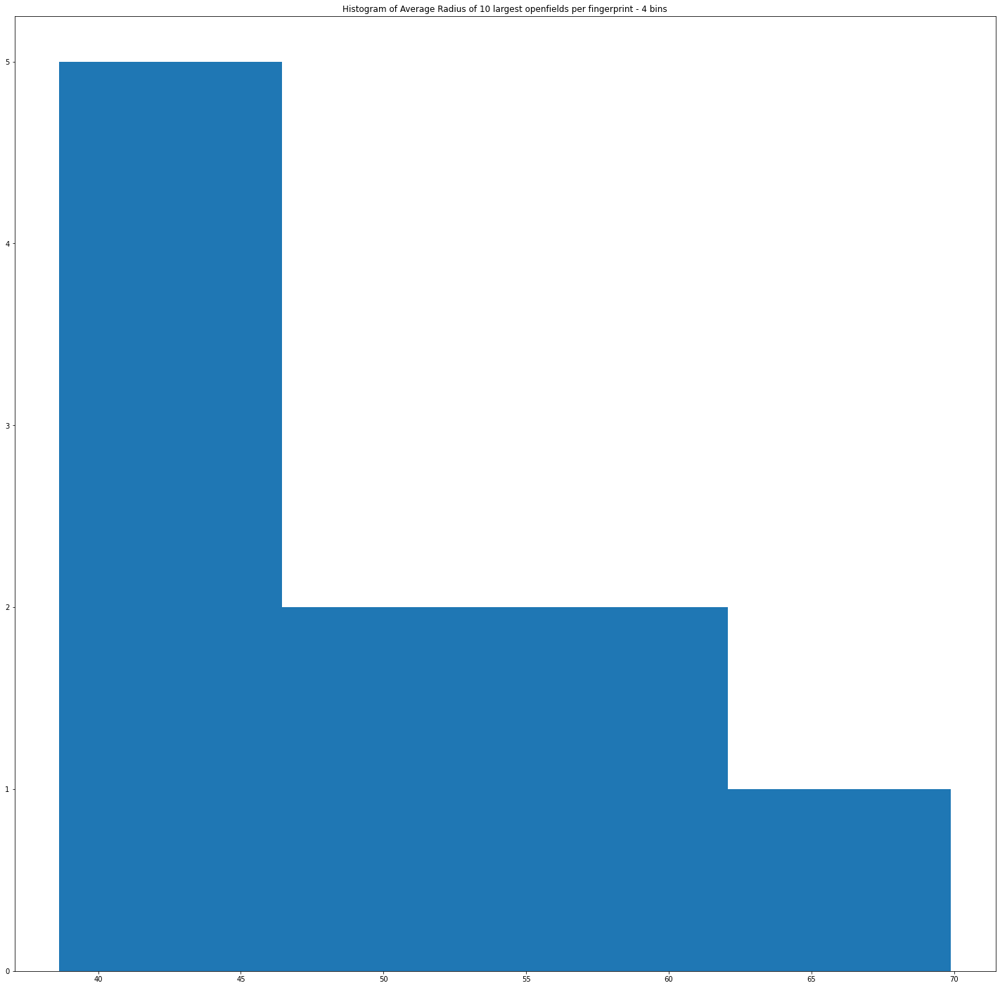

In [666]:

y = np.array(fp_circles)
#print(y.mean(axis=0))
g = [i for i in range(25)]

fig = plt.figure()
#plt.figure(figsize = (8,8))
fig.add_subplot(4,1,1)
plt.hist(fp_circles, bins=25)
plt.xticks(range(10, 130, 5))

plt.xlabel('Radius Length')
plt.title('Histogram of Radii of Openfields - 25 Bins')
plt.show()

fig.add_subplot(4,1,2)
#plt.figure(figsize = (8,8))
plt.hist(y[:,:10], bins=10)
plt.xticks(range(10, 130, 5))

plt.xlabel('Radius Length')
plt.title('Histogram of largest 10 Radii of Openfields - 10 Bins')
plt.show()


fig.add_subplot(4,1,3)
#plt.figure(figsize = (8,8))
plt.hist(y.mean(axis=0), bins=10 )
plt.title('Histogram of Average Radii of 25 largest openfields per fingerprint - 10 bins')
plt.xlabel('Radius Length')
plt.show()


fig.add_subplot(4,1,4)
#plt.figure(figsize = (8,8))
plt.hist(y[:,:10].mean(axis=0), bins=4)
plt.title('Histogram of Average Radius of 10 largest openfields per fingerprint - 4 bins')
plt.show()


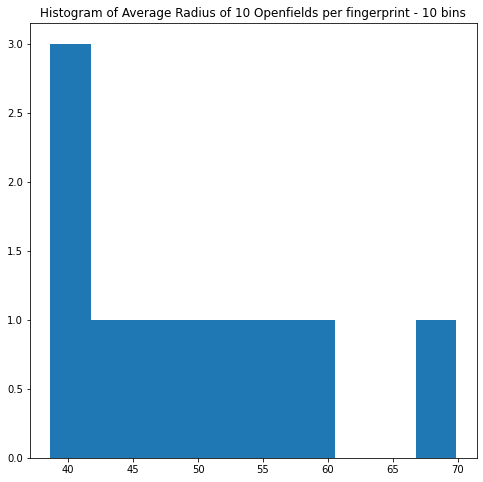

In [658]:
plt.figure(figsize = (8,8))
plt.(y[:,:10].mean(axis=0), bins=10)
plt.title('Histogram of Average Radius of 10 Openfields per fingerprint - 10 bins')
plt.show()


In [205]:
import json
file = open('/mnt/d/Biometrics Project/python/open_fields/open/open_fields.txt')
total_dict_of_circles = json.load(file)


fp_circles = []

for fp in total_dict_of_circles:
    fp_circles.append([_[2] for _ in total_dict_of_circles[fp]])

    
    

In [206]:

meta_info = {
        'arch': [],
        'whirl': [],
        'left_loop' : [],
        'right_loop' :[],
        'tented_arch' : [],
        'men':[],
        'women':[]
        }

file_names = open('/mnt/d/Biometrics Project/python/open_fields/file_names.txt')
file_names = file_names.readlines()

file2 = open('/mnt/d/Biometrics Project/python/open_fields/open/open_fields.txt')
total_dict_of_circles_meta = json.load(file2)


counter = 0
for name in file_names:
    # file_name.txt contains the gender and class information
    name = name.split()[0]
    file = open(f'/mnt/d/Biometrics Project/python/open_fields/{name}.txt')
    file = file.readlines()
    finger = name.split('_')[1] # finger number 
    gender = file[0].split(':')[1].split()[0]
    fingerprint_class = file[1].split(':')[1].split()[0]
    total_dict_of_circles_meta[name] = {'gender' : gender, 'class': fingerprint_class, 
                                   'finger': finger, 'openfields': total_dict_of_circles_meta[name]}
    if gender == 'M':
        meta_info['men'].append(name)
    elif gender == 'F':
        meta_info['women'].append(name)
    else:
        print(f"gender different: {name}")
    if fingerprint_class == 'W':
        meta_info['whirl'].append(name)
    elif fingerprint_class == 'A':
        meta_info['arch'].append(name)
    elif fingerprint_class == 'T':
        meta_info['tented_arch'].append(name)
    elif fingerprint_class == 'L':
        meta_info['left_loop'].append(name)
    elif fingerprint_class == 'R':
        meta_info['right_loop'].append(name)

        
print(meta_info)   
    
    
    
    
    


{'arch': ['F0005_03', 'F0006_09', 'F0012_01', 'F0013_03', 'F0015_01', 'F0016_08', 'F0018_08', 'F0020_06', 'F0027_08', 'F0030_10', 'F0031_02', 'F0032_03', 'F0043_08', 'F0051_09', 'F0058_10', 'F0059_02', 'F0064_07', 'F0069_10', 'F0070_10', 'F0079_05', 'F0081_07', 'F0088_02', 'F0092_07', 'F0094_03', 'F0097_06', 'F0098_07', 'F0099_02', 'F0111_02', 'F0120_08', 'F0121_07', 'F0137_01', 'F0145_10', 'F0151_06', 'F0161_04', 'F0168_02', 'F0170_02', 'F0189_09', 'F0190_08', 'F0194_10', 'F0196_05', 'F0215_01', 'F0218_02', 'F0221_06', 'F0227_02', 'F0230_10', 'F0236_04', 'F0237_07', 'F0240_01', 'F0249_04', 'F0251_05', 'F0259_10', 'F0262_05', 'F0267_07', 'F0268_09', 'F0271_04', 'F0279_06', 'F0301_02', 'F0315_03', 'F0320_10', 'F0322_06', 'F0325_06', 'F0326_07', 'F0330_08', 'F0332_03', 'F0346_09', 'F0349_09', 'F0357_07', 'F0364_03', 'F0366_06', 'F0368_09', 'F0373_09', 'F0381_01', 'F0383_04', 'F0391_01', 'F0393_06', 'F0397_06', 'F0402_01', 'F0407_09', 'F0418_02', 'F0427_06', 'F0441_10', 'F0444_03', 'F0449

In [15]:
total_dict_of_circles_meta

{'F0001_01': {'gender': 'M',
  'class': 'W',
  'finger': '01',
  'openfields': [[72, 113, 72],
   [444, 66, 67],
   [288, 379, 51],
   [50, 284, 50],
   [465, 179, 47],
   [129, 403, 46],
   [329, 278, 41],
   [282, 40, 41],
   [211, 185, 38],
   [474, 354, 37],
   [33, 414, 33],
   [479, 423, 32],
   [388, 318, 30],
   [317, 109, 30],
   [125, 28, 28],
   [374, 451, 28],
   [28, 210, 27],
   [231, 325, 27],
   [25, 25, 26],
   [387, 246, 25],
   [415, 372, 24],
   [226, 73, 24],
   [81, 454, 24],
   [349, 171, 24],
   [213, 373, 24]]},
 'F0002_05': {'gender': 'M',
  'class': 'R',
  'finger': '05',
  'openfields': [[133, 398, 81],
   [334, 107, 79],
   [54, 205, 54],
   [109, 67, 54],
   [408, 216, 52],
   [257, 432, 47],
   [445, 46, 47],
   [45, 305, 46],
   [448, 357, 44],
   [290, 253, 38],
   [220, 210, 37],
   [334, 337, 35],
   [458, 136, 35],
   [461, 282, 32],
   [31, 104, 31],
   [30, 30, 30],
   [462, 430, 30],
   [377, 290, 28],
   [191, 64, 28],
   [327, 400, 28],
   [390,

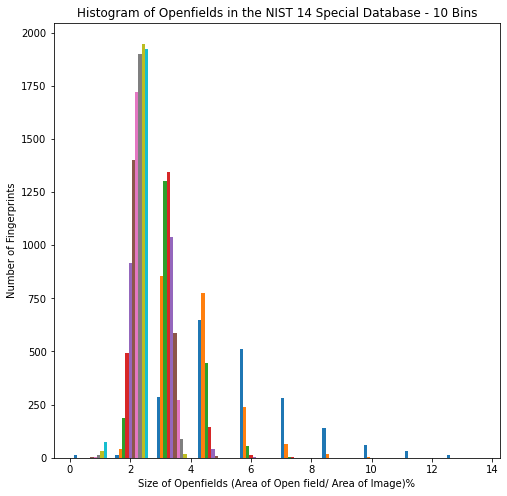

In [546]:
file = open('/mnt/d/Biometrics Project/python/open_fields/open/open_fields.txt')
total_dict_of_circles = json.load(file)

fp_circles = []
area_of_image = 512*512
for fp in total_dict_of_circles:
    def eqn(fvv):
        val = (fvv[2]**2)*(3.14/area_of_image)*100
        return val if val < 14 else 0
    aree= [eqn(_) for _ in total_dict_of_circles[fp]]
    fp_circles.append(aree)

    
y = np.array(fp_circles)
#print(y.mean(axis=0))
g = [i for i in range(25)]

# fig = plt.figure(figsize = (15,7))
# #plt.figure(figsize = (8,8))
# fig.add_subplot(1,1,1)
# plt.hist(fp_circles, bins=25)
# plt.xticks(range(0, 22, 2))
# plt.yticks(range(0, 22, 2))
# plt.xlabel('Area of Open field % of total size of fingerprint')
# plt.title('Histogram of Area size of Openfields - 25 Bins')
# plt.show()

fig = plt.figure(figsize = (8,8))
fig.add_subplot(1,1,1)
#plt.figure(figsize = (8,8))
plt.hist(y[:,:10], bins=10)
#plt.xticks(range(10, 130, 5))
#plt.xticks(range(0, 20))
plt.xlabel('Size of Openfields (Area of Open field/ Area of Image)%')
plt.ylabel('Number of Fingerprints')
plt.title('Histogram of Openfields in the NIST 14 Special Database - 10 Bins')
plt.show()


# fig = plt.figure()
# fig.add_subplot(1,1,1)
# #plt.figure(figsize = (8,8))
# plt.hist(y[:,:10].mean(axis=0), bins=4)
# plt.title('Histogram of Average Area size of 10 largest openfields per fingerprint - 4 bins')
# plt.show()


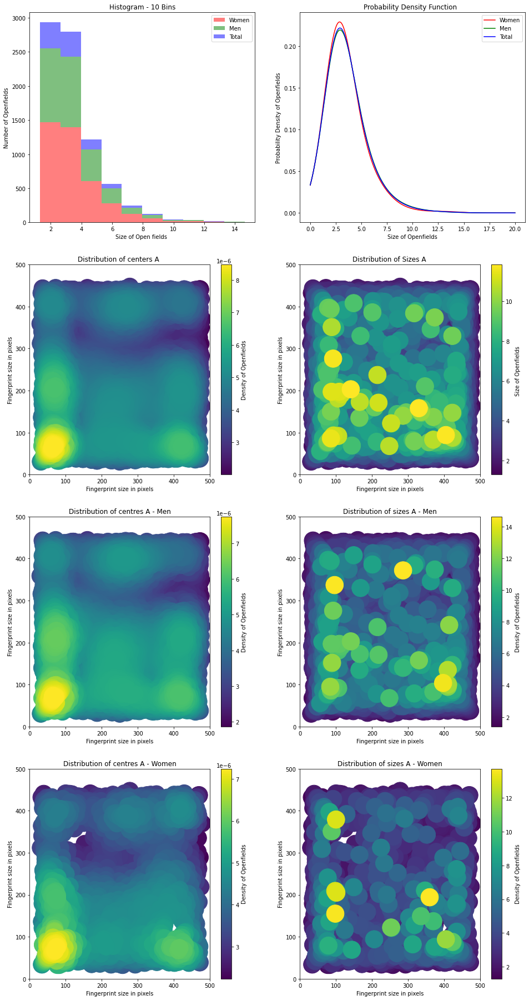

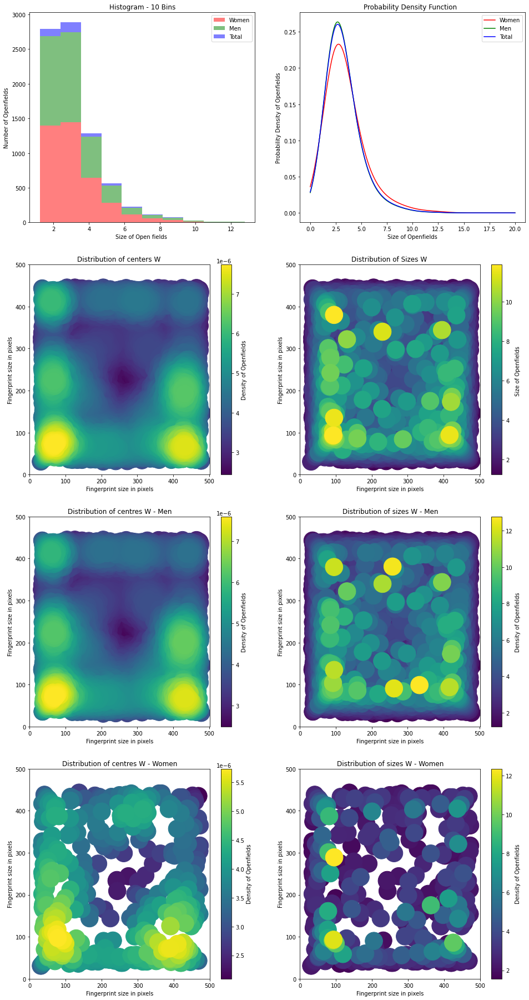

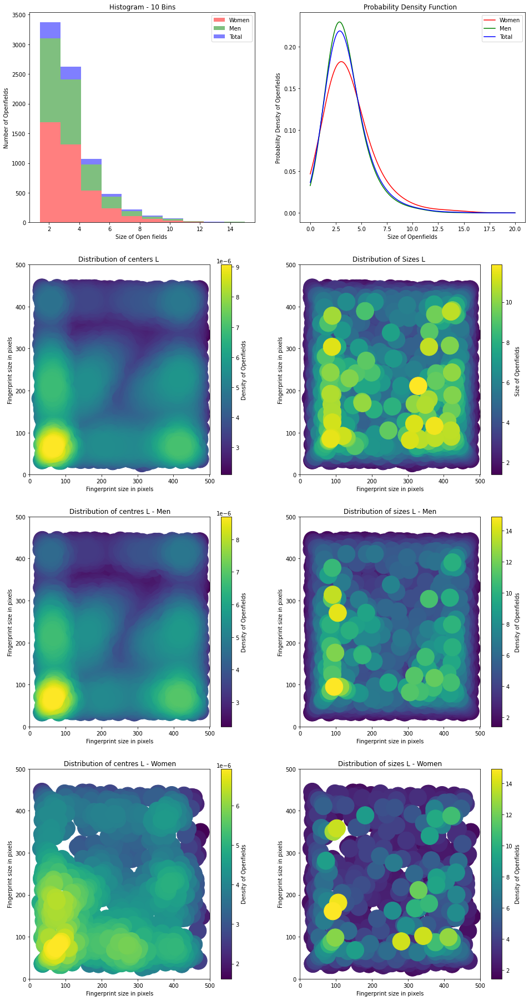

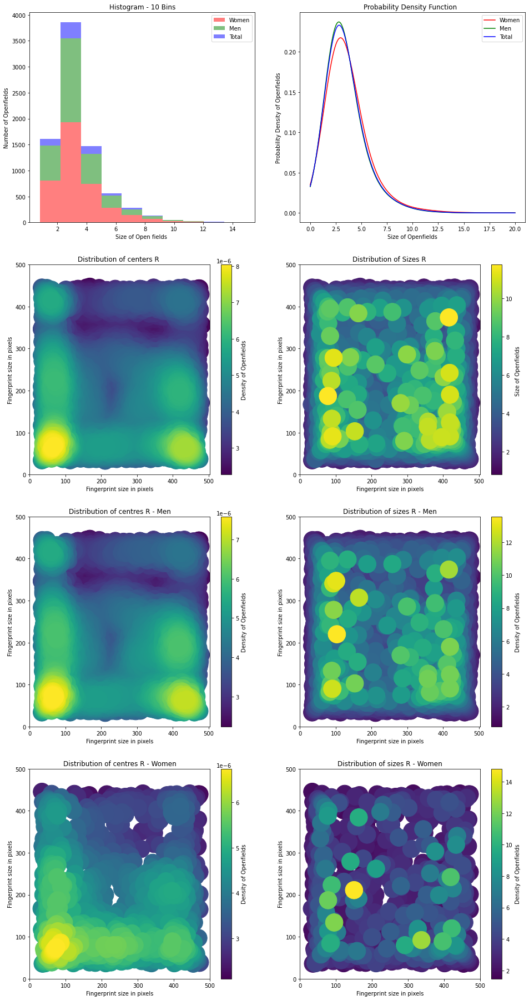

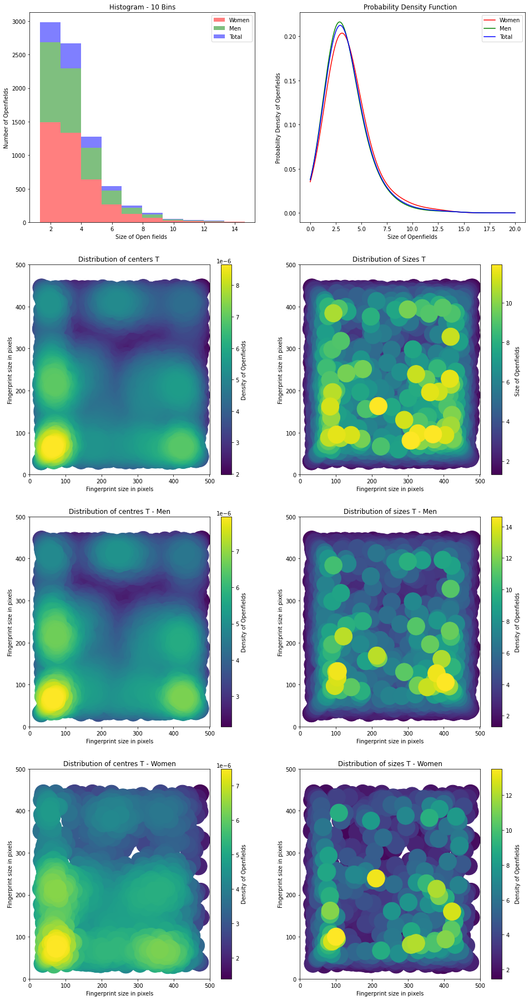

[[1128, 844, 1141, 869], [902, 1104, 1121, 865], [1104, 935, 1119, 826], [902, 1055, 1174, 861], [1166, 878, 1123, 805]]
{'arch': array([6.94719152, 5.18009151, 4.24701854, 3.6705943 , 3.23635217,
       2.89914901, 2.65063713, 2.44281789, 2.22894747, 2.07413926]), 'whirl': array([6.21289262, 4.62551915, 3.81199399, 3.29953284, 2.95087269,
       2.67913411, 2.4500528 , 2.24631968, 2.08421648, 1.95523853]), 'left_loop': array([6.9772741 , 5.1975798 , 4.24033766, 3.65098557, 3.22151287,
       2.88262542, 2.61090683, 2.38227   , 2.18974169, 2.03903737]), 'right_loop': array([6.55028524, 4.88956855, 4.08773354, 3.55095255, 3.16312431,
       2.82884512, 2.58399059, 2.36599205, 2.17230522, 2.01605283]), 'tented_arch': array([7.29964096, 5.2761693 , 4.29802523, 3.70429948, 3.24918642,
       2.91183809, 2.65009091, 2.41486746, 2.21711461, 2.05109217])}
arch men 298
arch women 102
whirl men 364
whirl women 36
left_loop men 331
left_loop women 69
right_loop men 331
right_loop women 69
tented

In [569]:
from scipy.stats import gaussian_kde
import seaborn as sns
import pandas as pd 
from sklearn.cluster import KMeans


area_of_image = 512*512
countsyy = []
average_size_per_fp = {'arch':[],'whirl':[], 'left_loop' : [], 
                       'right_loop': [],'tented_arch': []}
typesd = {'arch' : 'A', 'whirl' : 'W', 'left_loop': 'L', 'right_loop' : 'R', 'tented_arch' :'T'}
for i in ['arch', 'whirl', 'left_loop', 'right_loop', 'tented_arch']:
#for i in ['whirl']:
    fp_circles = []
    men_circles = []
    women_circles = [] 
    fp_xy = []
    men_x = []
    men_y = []
    men_area = []
    women_x = []
    women_y = []
    women_area = []
    fp_x = []
    fp_y = []
    fp_area = []
    for file_name in meta_info[i]:    
        #for fp in file_name:
        im2 = cv.imread(f'/mnt/d/Biometrics Project/python/open_fields/open/{file_name.split()[0]}_min.bmp')
        area_of_image = im2.shape[0]*im2.shape[1]
        fp_circles.append([(_[2]**2)*(3.14/area_of_image)*100 for _ in total_dict_of_circles[file_name]])
        fp_xy.append([(_[0],_[1],_[2]) for _ in total_dict_of_circles[file_name]])
        for c,v in enumerate(total_dict_of_circles[file_name]):
            if c<10:
                fp_x.append(v[0])
                fp_y.append(v[1])
                fp_area.append((v[2]**2)*(3.14/area_of_image)*100)
        if file_name in meta_info['men']:
            men_circles.append([(_[2]**2)*(3.14/area_of_image)*100 for _ in total_dict_of_circles[file_name]])
            for c, v in enumerate(total_dict_of_circles[file_name]):
                if c < 10:
                    men_x.append(v[0])
                    men_y.append(v[1])
                    men_area.append((v[2]**2)*(3.14/area_of_image)*100)

        else:
            women_circles.append([(_[2]**2)*(3.14/area_of_image)*100 for _ in total_dict_of_circles[file_name]])
            for c, v in enumerate(total_dict_of_circles[file_name]):
                if c < 10:
                    women_x.append(v[0])
                    women_y.append(v[1])
                    women_area.append((v[2]**2)*(3.14/area_of_image)*100)
    y = np.array(fp_circles)
    #print(y.mean(axis=0))
    y_men = np.array(men_circles)
    y_women = np.array(women_circles)

    
    fp_area = np.array(fp_area)
    #data = pd.DataFrame({'X': fp_x, 'Y': fp_y, 'Z': fp_area})
    #data= data[data.Z < 12]
    average_size_per_fp[i] = y[:,:10].mean(axis=0)
    
    fig = plt.figure(figsize=(16,32))
    #plt.subplots_adjust(hspace = .5)
    fig.add_subplot(4,2,1)
    #plt.figure(figsize = (8,8))
    y =y[:,:10]
    y_men = y_men[:,:10]
    y_women = y_women[:,:10]
    #print(y,y_men,y_women)
    y = y[y < 15]
    y_men = y_men[y_men < 15]
    y_women = y_women[y_women < 15]
    plt.hist(
            #[y[:,:10].flatten(),y_men[:,:10].flatten(),y_women[:,:10].flatten()], 
            [y,y_men,y_women],
             histtype='bar',alpha=0.5, color=['red','green','blue'], 
             bins=10,label=['Women', 'Men', 'Total',], stacked=True)
    plt.legend()
    #plt.xticks(range(0,15,1))
    plt.xlabel(f'Size of Open fields ')
    plt.ylabel('Number of Openfields')
    plt.title('Histogram - 10 Bins')
    #plt.show()
    
    
    #fig = plt.figure()
    fig.add_subplot(4,2,2)
    #plt.figure(figsize = (8,8))
    #plt.hist(y_men[:,:10].flatten(),density=True, bins=5)
    men_density = gaussian_kde(y_men)#y_men[:,:10].flatten())
    women_density=gaussian_kde(y_women)#y_women[:,:10].flatten())
    total_density=gaussian_kde(y)#y[:,:10].flatten())
    xs = np.linspace(0,20,len(y))
    xs1 = np.linspace(0,20,len(y_women))
    xs2 = np.linspace(0,20,len(y_men))
    men_density.covariance_factor = lambda : .75
    men_density._compute_covariance()
    women_density.covariance_factor = lambda : .75
    women_density._compute_covariance()
    total_density.covariance_factor = lambda : .75
    total_density._compute_covariance()
    #plt.plot(xs,men_density(xs))
    plt.plot(xs1,women_density(xs1), label='Women', color='red')
    plt.plot(xs2,men_density(xs2), label='Men',  color='green')
    plt.plot(xs,total_density(xs), label='Total',  color='blue')
   
    #plt.yticks(np.linspace(0,.23,20))
    plt.legend()
    plt.ylabel('Probability Density of Openfields')
    plt.xlabel(f'Size of Openfields')
    plt.title('Probability Density Function  ')
    #plt.show()


       
    #fig = plt.figure(figsize = (17,8))
    #plt.subplots_adjust(hspace = 1)
    fig.add_subplot(4,2,3)
    xy = np.vstack([men_x + women_x, men_y + women_y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    total_x = np.array(men_x+women_x)
    total_y = np.array(men_y+women_y)
    total_x, total_y, z = total_x[idx], total_y[idx],z[idx]
    plt.scatter(total_x, total_y, c=z, s=1000)
    plt.colorbar(label='Density of Openfields')
    plt.xticks(range(0, 512, 100))
    plt.yticks(range(0, 512, 100))
    plt.xlabel('Fingerprint size in pixels')
    plt.ylabel('Fingerprint size in pixels')
    plt.title(f'Distribution of centers {typesd[i]} ')
    #plt.show()
    
    
    
    fig.add_subplot(4,2,4)
    data = pd.DataFrame({'X': fp_x, 'Y': fp_y, 'Z': fp_area})
    data= data[data.Z < 12]
    #print(data)
    #data_pivoted = data.pivot("X", "Y", "Z")
    total_fp_area= np.array(data.Z)
    #total_fp_area = gaussian_kde(total_fp_area)(total_fp_area)
    #print(total_fp_area)
    
    total_fp_x = np.array(data.X)
    total_fp_y = np.array(data.Y)
    idx = total_fp_area.argsort()
    #ticks = np.linspace(0, 1, 12, endpoint=True)

    total_fp_x, total_fp_y, total_fp_area = total_fp_x[idx], total_fp_y[idx], total_fp_area[idx]
    plt.scatter(total_fp_x, total_fp_y, c=total_fp_area,s=1000)
    plt.colorbar(label='Size of Openfields ')
    plt.xticks(range(0, 512, 100))
    plt.yticks(range(0, 512, 100))
    plt.xlabel('Fingerprint size in pixels')
    plt.ylabel('Fingerprint size in pixels')
    plt.title(f'Distribution of Sizes {typesd[i]} ')
    #ax = sns.heatmap(data)
    #plt.show()
    
    
    
    
    # KMEANS 
    #fig = plt.figure(figsize=(8,8))
    #data = pd.DataFrame({'X': total_fp_x, 'Y': total_fp_y, 'Z': total_fp_area})
    kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
    y = kmeans.fit_predict(data)
    countsyy.append([len(data[y==0]),len(data[y==1]),len(data[y==2]),len(data[y==3])])
    #print(len(data[y==0]),len(data[y==1]),len(data[y==2]),len(data[y==3]))
    #plt.scatter(data[y==0]['X'], data[y==0]['Y'], s=100, c='#e66101', alpha=1, label =len(data[y==0]))
    #plt.scatter(data[y==1]['X'], data[y==1]['Y'], s=100, c='#b3cde3', alpha=1, label =len(data[y==1]))
    #plt.scatter(data[y==2]['X'], data[y==2]['Y'], s=100, c='#fdb863', alpha=1, label =len(data[y==2]))
    #plt.scatter(data[y==3]['X'], data[y==3]['Y'], s=100, c='#5e3c99',  alpha=1,label =len(data[y==3]))
    #plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
    #            s=300, c='magenta', label = 'Centroids')
    #plt.title(f'In which quadrant do most of the open fields lie in a {i} fingerprint? ')
    #plt.legend()
    #plt.show()
    
    
       
#     # KMEANS 
#     fig = plt.figure()
#     data = pd.DataFrame({'X': total_fp_x, 'Y': total_fp_y, 'Z': total_fp_area})
#     kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
#     y = kmeans.fit_predict(data)
#     plt.scatter(data[y==0]['X'], data[y==0]['Z'], s=100, c='red', alpha=.5, label ='Very Large')
#     plt.scatter(data[y==1]['X'], data[y==1]['Z'], s=100, c='blue', alpha=.5, label ='Large')
#     plt.scatter(data[y==2]['X'], data[y==2]['Z'], s=100, c='green', alpha=.5, label ='Medium')
#     plt.scatter(data[y==3]['X'], data[y==3]['Z'], s=100, c='cyan',  alpha=.5,label ='Small')
#     plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
#                 s=300, c='magenta', label = 'Centroids')
#     plt.legend()
#     plt.show()
    
    
#        # KMEANS 
#     fig = plt.figure()
#     data = pd.DataFrame({'X': total_fp_x, 'Y': total_fp_y, 'Z': total_fp_area})
#     kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
#     y = kmeans.fit_predict(data)
#     plt.scatter(data[y==0]['Y'], data[y==0]['Z'], s=100, c='red', alpha=.5, label ='Very Large')
#     plt.scatter(data[y==1]['Y'], data[y==1]['Z'], s=100, c='blue', alpha=.5, label ='Large')
#     plt.scatter(data[y==2]['Y'], data[y==2]['Z'], s=100, c='green', alpha=.5, label ='Medium')
#     plt.scatter(data[y==3]['Y'], data[y==3]['Z'], s=100, c='cyan',  alpha=.5,label ='Small')
#     plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
#                 s=300, c='magenta', label = 'Centroids')
#     plt.legend()
#     plt.show()
    
    
    
    
    
    
    
    #fig = plt.figure(figsize=(17,8))
    #plt.subplots_adjust(hspace = 1)
    fig.add_subplot(4,2,5)
    xy = np.vstack([men_x, men_y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    total_men_x = np.array(men_x)
    total_men_y = np.array(men_y)
    total_men_x, total_men_y, z = total_men_x[idx], total_men_y[idx],z[idx]
    plt.scatter(total_men_x, total_men_y, c=z, s=1000)
    plt.colorbar(label='Density of Openfields')
    plt.xticks(range(0, 512, 100))
    plt.yticks(range(0, 512, 100))
    plt.xlabel('Fingerprint size in pixels')
    plt.ylabel('Fingerprint size in pixels')
    plt.title(f'Distribution of centres {typesd[i]} - Men')
    #plt.show()
    
    #fig = plt.figure(figsize = (8,8))
  
    data = pd.DataFrame({'X': men_x, 'Y': men_y, 'Z': men_area})
    data= data[data.Z < 15]
      
    
    
    fig.add_subplot(4,2,6)
    #xy = np.vstack([men_x, men_y])
    #z = gaussian_kde(xy)(xy)
    total_men_x = np.array(data.X)
    total_men_y = np.array(data.Y)
    total_men_area = np.array(data.Z)
    idx = total_men_area.argsort()
    total_men_x, total_men_y, total_men_area = total_men_x[idx], total_men_y[idx],total_men_area[idx]
    plt.scatter(total_men_x, total_men_y, c=total_men_area, s=1000)
    plt.colorbar(label='Density of Openfields')
    plt.xticks(range(0, 512, 100))
    plt.yticks(range(0, 512, 100))
    plt.xlabel('Fingerprint size in pixels')
    plt.ylabel('Fingerprint size in pixels')
    plt.title(f'Distribution of sizes {typesd[i]} - Men')
    #plt.show()
    
        
    
    ####
    
    #fig = plt.figure(figsize = (8,8))
    #fig = plt.figure(figsize=(17,8))
    #plt.subplots_adjust(hspace = 1)
    fig.add_subplot(4,2,7)
    xy = np.vstack([women_x, women_y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    total_women_x = np.array(women_x)
    total_women_y = np.array(women_y)
    total_women_x, total_women_y, z = total_women_x[idx], total_women_y[idx],z[idx]
    
    plt.scatter(total_women_x, total_women_y, c=z, s=1000)
    plt.colorbar(label='Density of Openfields')
    plt.xticks(range(0, 512, 100))
    plt.yticks(range(0, 512, 100))
    plt.xlabel('Fingerprint size in pixels')
    plt.ylabel('Fingerprint size in pixels')
    plt.title(f'Distribution of centres {typesd[i]} - Women')
    #plt.show()
        

   
   
    
    fig.add_subplot(4,2,8)
    #xy = np.vstack([women_x, women_y])
    #z = gaussian_kde(xy)(xy)
    data = pd.DataFrame({'X': women_x, 'Y': women_y, 'Z': women_area})
    data= data[data.Z < 15]
      
    total_women_x = np.array(data.X)
    total_women_y = np.array(data.Y)
    total_women_area = np.array(data.Z)
    idx = total_women_area.argsort()
    total_women_x, total_women_y, total_women_area = total_women_x[idx], total_women_y[idx],total_women_area[idx]
   
    plt.scatter(total_women_x, total_women_y, c=total_women_area, s=1000)
    plt.colorbar(label='Density of Openfields')
    plt.xticks(range(0, 512, 100))
    plt.yticks(range(0, 512, 100))
    plt.xlabel('Fingerprint size in pixels')
    plt.ylabel('Fingerprint size in pixels')
    plt.title(f'Distribution of sizes {typesd[i]} - Women')
    plt.show()

#    fig = plt.figure(figsize = (15,7))
#     fig.add_subplot(1,1,1)
#     #plt.figure(figsize = (8,8))
#     plt.hist(y_women[:,:10].flatten(),density=True, bins=5)
#     #plt.xticks(range(10, 130, 5))
#     plt.xticks(range(0, 20, 1))
#     plt.xlabel(f'Area of Open field % of total size of fingerprint in {i} - Women')
#     plt.title('Histogram of largest 10 Radii of Openfields - 10 Bins')
#     plt.show()

#     fig = plt.figure()
#     fig.add_subplot(1,1,1)
#     #plt.figure(figsize = (8,8))
#     plt.hist(y[:,:10].mean(axis=0), bins=4)
#     plt.title('Histogram of Average Area size of 10 largest openfields per fingerprint - 4 bins')
#     plt.show()

#     fig = plt.figure()
#     fig.add_subplot(1,1,1)
#     #plt.figure(figsize = (8,8))
#     plt.hist(y_men[:,:10].mean(axis=0), bins=4)
#     plt.title(f'Histogram of Average Area size of 10 largest openfields per fingerprint in {i} - Men - 4 bins ')
#     plt.show()

#     fig = plt.figure()
#     fig.add_subplot(1,1,1)
#     #plt.figure(figsize = (8,8))
#     plt.hist(y_women[:,:10].mean(axis=0), bins=4)
#     plt.title(f'Histogram of Average Area size of 10 largest openfields per fingerprint in {i} - Women - 4 bins')
#     plt.show()


    
print(countsyy)
print(average_size_per_fp)

    
for i in ['arch', 'whirl', 'left_loop', 'right_loop', 'tented_arch']:
    print(i,'men', len(set(meta_info[i]).intersection(set(meta_info['men']))))
    print(i, 'women', len(set(meta_info[i]).intersection(set(meta_info['women']))))


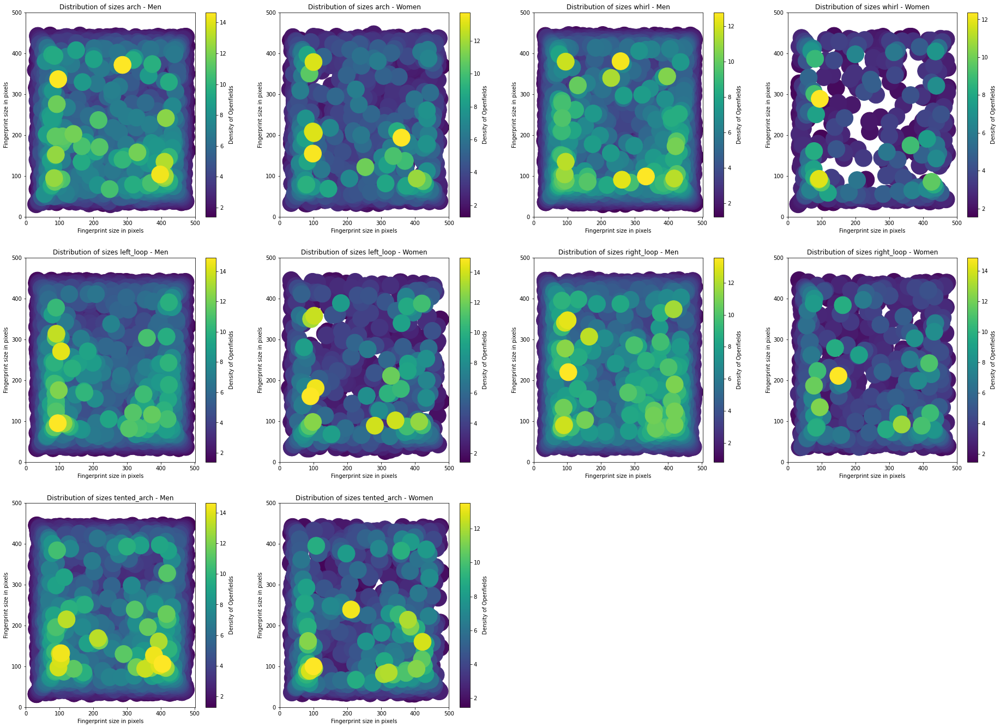

[]
{'arch': array([6.94719152, 5.18009151, 4.24701854, 3.6705943 , 3.23635217,
       2.89914901, 2.65063713, 2.44281789, 2.22894747, 2.07413926]), 'whirl': array([6.21289262, 4.62551915, 3.81199399, 3.29953284, 2.95087269,
       2.67913411, 2.4500528 , 2.24631968, 2.08421648, 1.95523853]), 'left_loop': array([6.9772741 , 5.1975798 , 4.24033766, 3.65098557, 3.22151287,
       2.88262542, 2.61090683, 2.38227   , 2.18974169, 2.03903737]), 'right_loop': array([6.55028524, 4.88956855, 4.08773354, 3.55095255, 3.16312431,
       2.82884512, 2.58399059, 2.36599205, 2.17230522, 2.01605283]), 'tented_arch': array([7.29964096, 5.2761693 , 4.29802523, 3.70429948, 3.24918642,
       2.91183809, 2.65009091, 2.41486746, 2.21711461, 2.05109217])}
arch men 298
arch women 102
whirl men 364
whirl women 36
left_loop men 331
left_loop women 69
right_loop men 331
right_loop women 69
tented_arch men 301
tented_arch women 99


In [583]:
from scipy.stats import gaussian_kde
import seaborn as sns
import pandas as pd 
from sklearn.cluster import KMeans


area_of_image = 512*512
fig = plt.figure(figsize=(32,40))
countsyy = []
average_size_per_fp = {'arch':[],'whirl':[], 'left_loop' : [], 
                       'right_loop': [],'tented_arch': []}
iterator = iter(range(1,21))
typesd = {'arch' : 'A', 'whirl' : 'W', 'left_loop': 'L', 'right_loop' : 'R', 'tented_arch' :'T'}
for cc, i in enumerate(['arch', 'whirl', 'left_loop', 'right_loop', 'tented_arch']):
#for i in ['whirl']:
    fp_circles = []
    men_circles = []
    women_circles = [] 
    fp_xy = []
    men_x = []
    men_y = []
    men_area = []
    women_x = []
    women_y = []
    women_area = []
    fp_x = []
    fp_y = []
    fp_area = []
    for file_name in meta_info[i]:    
        #for fp in file_name:
        im2 = cv.imread(f'/mnt/d/Biometrics Project/python/open_fields/open/{file_name.split()[0]}_min.bmp')
        area_of_image = im2.shape[0]*im2.shape[1]
        fp_circles.append([(_[2]**2)*(3.14/area_of_image)*100 for _ in total_dict_of_circles[file_name]])
        fp_xy.append([(_[0],_[1],_[2]) for _ in total_dict_of_circles[file_name]])
        for c,v in enumerate(total_dict_of_circles[file_name]):
            if c<10:
                fp_x.append(v[0])
                fp_y.append(v[1])
                fp_area.append((v[2]**2)*(3.14/area_of_image)*100)
        if file_name in meta_info['men']:
            men_circles.append([(_[2]**2)*(3.14/area_of_image)*100 for _ in total_dict_of_circles[file_name]])
            for c, v in enumerate(total_dict_of_circles[file_name]):
                if c < 10:
                    men_x.append(v[0])
                    men_y.append(v[1])
                    men_area.append((v[2]**2)*(3.14/area_of_image)*100)

        else:
            women_circles.append([(_[2]**2)*(3.14/area_of_image)*100 for _ in total_dict_of_circles[file_name]])
            for c, v in enumerate(total_dict_of_circles[file_name]):
                if c < 10:
                    women_x.append(v[0])
                    women_y.append(v[1])
                    women_area.append((v[2]**2)*(3.14/area_of_image)*100)
    y = np.array(fp_circles)
    #print(y.mean(axis=0))
    y_men = np.array(men_circles)
    y_women = np.array(women_circles)

    
    fp_area = np.array(fp_area)
    #data = pd.DataFrame({'X': fp_x, 'Y': fp_y, 'Z': fp_area})
    #data= data[data.Z < 12]
    average_size_per_fp[i] = y[:,:10].mean(axis=0)
    
    
    #plt.subplots_adjust(hspace = .5)
#     fig.add_subplot(5,4,next(iterator))
#     #plt.figure(figsize = (8,8))
#     y =y[:,:10]
#     y_men = y_men[:,:10]
#     y_women = y_women[:,:10]
#     #print(y,y_men,y_women)
#     y = y[y < 15]
#     y_men = y_men[y_men < 15]
#     y_women = y_women[y_women < 15]
#     plt.hist(
#             #[y[:,:10].flatten(),y_men[:,:10].flatten(),y_women[:,:10].flatten()], 
#             [y,y_men,y_women],
#              histtype='bar',alpha=0.5, color=['red','green','blue'], 
#              bins=10,label=['Women', 'Men', 'Total',], stacked=True)
#     plt.legend()
#     #plt.xticks(range(0,15,1))
#     plt.xlabel(f'Size of Open fields ')
#     plt.ylabel('Number of Openfields')
#     plt.title(f'Histogram {i}- 10 Bins')
#     #plt.show()
    
    
#     #fig = plt.figure()
#     fig.add_subplot(5,4,next(iterator))
#     #plt.figure(figsize = (8,8))
#     #plt.hist(y_men[:,:10].flatten(),density=True, bins=5)
#     men_density = gaussian_kde(y_men)#y_men[:,:10].flatten())
#     women_density=gaussian_kde(y_women)#y_women[:,:10].flatten())
#     total_density=gaussian_kde(y)#y[:,:10].flatten())
#     xs = np.linspace(0,20,len(y))
#     xs1 = np.linspace(0,20,len(y_women))
#     xs2 = np.linspace(0,20,len(y_men))
#     men_density.covariance_factor = lambda : .75
#     men_density._compute_covariance()
#     women_density.covariance_factor = lambda : .75
#     women_density._compute_covariance()
#     total_density.covariance_factor = lambda : .75
#     total_density._compute_covariance()
#     #plt.plot(xs,men_density(xs))
#     plt.plot(xs1,women_density(xs1), label='Women', color='red')
#     plt.plot(xs2,men_density(xs2), label='Men',  color='green')
#     plt.plot(xs,total_density(xs), label='Total',  color='blue')
   
#     #plt.yticks(np.linspace(0,.23,20))
#     plt.legend()
#     plt.ylabel('Probability Density of Openfields')
#     plt.xlabel(f'Size of Openfields')
#     plt.title(f'Probability Density Function {i}')
#     #plt.show()


       
# #     #fig = plt.figure(figsize = (17,8))
#     #plt.subplots_adjust(hspace = 1)
#     fig.add_subplot(5,4,next(iterator))   
#     xy = np.vstack([men_x + women_x, men_y + women_y])
#     z = gaussian_kde(xy)(xy)
#     idx = z.argsort()
#     total_x = np.array(men_x+women_x)
#     total_y = np.array(men_y+women_y)
#     total_x, total_y, z = total_x[idx], total_y[idx],z[idx]
#     plt.scatter(total_x, total_y, c=z, s=1000)
#     plt.colorbar(label='Density of Openfields')
#     plt.xticks(range(0, 512, 100))
#     plt.yticks(range(0, 512, 100))
#     plt.xlabel('Fingerprint size in pixels')
#     plt.ylabel('Fingerprint size in pixels')
#     plt.title(f'Distribution of centers {i} ')
#     #plt.show()
    
    
    
#     #fig.add_subplot(4,2,4)
#     fig.add_subplot(5,4,next(iterator))
#     data = pd.DataFrame({'X': fp_x, 'Y': fp_y, 'Z': fp_area})
#     data= data[data.Z < 12]
#     #print(data)
#     #data_pivoted = data.pivot("X", "Y", "Z")
#     total_fp_area= np.array(data.Z)
#     #total_fp_area = gaussian_kde(total_fp_area)(total_fp_area)
#     #print(total_fp_area)
    
#     total_fp_x = np.array(data.X)
#     total_fp_y = np.array(data.Y)
#     idx = total_fp_area.argsort()
#     #ticks = np.linspace(0, 1, 12, endpoint=True)

#     total_fp_x, total_fp_y, total_fp_area = total_fp_x[idx], total_fp_y[idx], total_fp_area[idx]
#     plt.scatter(total_fp_x, total_fp_y, c=total_fp_area,s=1000)
#     plt.colorbar(label='Size of Openfields ')
#     plt.xticks(range(0, 512, 100))
#     plt.yticks(range(0, 512, 100))
#     plt.xlabel('Fingerprint size in pixels')
#     plt.ylabel('Fingerprint size in pixels')
#     plt.title(f'Distribution of Sizes {i} ')
#     #ax = sns.heatmap(data)
#     #plt.show()
    
    
    
    
#     # KMEANS 
#     #fig = plt.figure(figsize=(8,8))
#     #data = pd.DataFrame({'X': total_fp_x, 'Y': total_fp_y, 'Z': total_fp_area})
#     kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
#     y = kmeans.fit_predict(data)
#     countsyy.append([len(data[y==0]),len(data[y==1]),len(data[y==2]),len(data[y==3])])
#     #print(len(data[y==0]),len(data[y==1]),len(data[y==2]),len(data[y==3]))
#     #plt.scatter(data[y==0]['X'], data[y==0]['Y'], s=100, c='#e66101', alpha=1, label =len(data[y==0]))
#     #plt.scatter(data[y==1]['X'], data[y==1]['Y'], s=100, c='#b3cde3', alpha=1, label =len(data[y==1]))
#     #plt.scatter(data[y==2]['X'], data[y==2]['Y'], s=100, c='#fdb863', alpha=1, label =len(data[y==2]))
#     #plt.scatter(data[y==3]['X'], data[y==3]['Y'], s=100, c='#5e3c99',  alpha=1,label =len(data[y==3]))
#     #plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
#     #            s=300, c='magenta', label = 'Centroids')
#     #plt.title(f'In which quadrant do most of the open fields lie in a {i} fingerprint? ')
#     #plt.legend()
#     #plt.show()
    
    
       
# #     # KMEANS 
# #     fig = plt.figure()
# #     data = pd.DataFrame({'X': total_fp_x, 'Y': total_fp_y, 'Z': total_fp_area})
# #     kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
# #     y = kmeans.fit_predict(data)
# #     plt.scatter(data[y==0]['X'], data[y==0]['Z'], s=100, c='red', alpha=.5, label ='Very Large')
# #     plt.scatter(data[y==1]['X'], data[y==1]['Z'], s=100, c='blue', alpha=.5, label ='Large')
# #     plt.scatter(data[y==2]['X'], data[y==2]['Z'], s=100, c='green', alpha=.5, label ='Medium')
# #     plt.scatter(data[y==3]['X'], data[y==3]['Z'], s=100, c='cyan',  alpha=.5,label ='Small')
# #     plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
# #                 s=300, c='magenta', label = 'Centroids')
# #     plt.legend()
# #     plt.show()
    
    
# #        # KMEANS 
# #     fig = plt.figure()
# #     data = pd.DataFrame({'X': total_fp_x, 'Y': total_fp_y, 'Z': total_fp_area})
# #     kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
# #     y = kmeans.fit_predict(data)
# #     plt.scatter(data[y==0]['Y'], data[y==0]['Z'], s=100, c='red', alpha=.5, label ='Very Large')
# #     plt.scatter(data[y==1]['Y'], data[y==1]['Z'], s=100, c='blue', alpha=.5, label ='Large')
# #     plt.scatter(data[y==2]['Y'], data[y==2]['Z'], s=100, c='green', alpha=.5, label ='Medium')
# #     plt.scatter(data[y==3]['Y'], data[y==3]['Z'], s=100, c='cyan',  alpha=.5,label ='Small')
# #     plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
# #                 s=300, c='magenta', label = 'Centroids')
# #     plt.legend()
# #     plt.show()
    
    
    
    
    
    
    
#     #fig = plt.figure(figsize=(17,8))
#     #plt.subplots_adjust(hspace = 1)
#     fig.add_subplot(4,2,5)
#     xy = np.vstack([men_x, men_y])
#     z = gaussian_kde(xy)(xy)
#     idx = z.argsort()
#     total_men_x = np.array(men_x)
#     total_men_y = np.array(men_y)
#     total_men_x, total_men_y, z = total_men_x[idx], total_men_y[idx],z[idx]
#     plt.scatter(total_men_x, total_men_y, c=z, s=1000)
#     plt.colorbar(label='Density of Openfields')
#     plt.xticks(range(0, 512, 100))
#     plt.yticks(range(0, 512, 100))
#     plt.xlabel('Fingerprint size in pixels')
#     plt.ylabel('Fingerprint size in pixels')
#     plt.title(f'Distribution of centres {typesd[i]} - Men')
#     #plt.show()
    
#     #fig = plt.figure(figsize = (8,8))
  
    data = pd.DataFrame({'X': men_x, 'Y': men_y, 'Z': men_area})
    data= data[data.Z < 15]
      
    fig.add_subplot(5,4,next(iterator))
    #xy = np.vstack([men_x, men_y])
    #z = gaussian_kde(xy)(xy)
    total_men_x = np.array(data.X)
    total_men_y = np.array(data.Y)
    total_men_area = np.array(data.Z)
    idx = total_men_area.argsort()
    total_men_x, total_men_y, total_men_area = total_men_x[idx], total_men_y[idx],total_men_area[idx]
    plt.scatter(total_men_x, total_men_y, c=total_men_area, s=1000)
    plt.colorbar(label='Density of Openfields')
    plt.xticks(range(0, 512, 100))
    plt.yticks(range(0, 512, 100))
    plt.xlabel('Fingerprint size in pixels')
    plt.ylabel('Fingerprint size in pixels')
    plt.title(f'Distribution of sizes {i} - Men')
    #plt.show()
    
        
    
#     ####
    
#     #fig = plt.figure(figsize = (8,8))
#     #fig = plt.figure(figsize=(17,8))
#     #plt.subplots_adjust(hspace = 1)
#     fig.add_subplot(4,2,7)
#     xy = np.vstack([women_x, women_y])
#     z = gaussian_kde(xy)(xy)
#     idx = z.argsort()
#     total_women_x = np.array(women_x)
#     total_women_y = np.array(women_y)
#     total_women_x, total_women_y, z = total_women_x[idx], total_women_y[idx],z[idx]
    
#     plt.scatter(total_women_x, total_women_y, c=z, s=1000)
#     plt.colorbar(label='Density of Openfields')
#     plt.xticks(range(0, 512, 100))
#     plt.yticks(range(0, 512, 100))
#     plt.xlabel('Fingerprint size in pixels')
#     plt.ylabel('Fingerprint size in pixels')
#     plt.title(f'Distribution of centres {typesd[i]} - Women')
#     #plt.show()
        

   
   
    data = pd.DataFrame({'X': women_x, 'Y': women_y, 'Z': women_area})
    data= data[data.Z < 15]
    fig.add_subplot(5,4,next(iterator))
    #xy = np.vstack([women_x, women_y])
    #z = gaussian_kde(xy)(xy)
   
      
    total_women_x = np.array(data.X)
    total_women_y = np.array(data.Y)
    total_women_area = np.array(data.Z)
    idx = total_women_area.argsort()
    total_women_x, total_women_y, total_women_area = total_women_x[idx], total_women_y[idx],total_women_area[idx]
   
    plt.scatter(total_women_x, total_women_y, c=total_women_area, s=1000)
    plt.colorbar(label='Density of Openfields')
    plt.xticks(range(0, 512, 100))
    plt.yticks(range(0, 512, 100))
    plt.xlabel('Fingerprint size in pixels')
    plt.ylabel('Fingerprint size in pixels')
    plt.title(f'Distribution of sizes {i} - Women')
    #plt.show()

# #    fig = plt.figure(figsize = (15,7))
# #     fig.add_subplot(1,1,1)
# #     #plt.figure(figsize = (8,8))
# #     plt.hist(y_women[:,:10].flatten(),density=True, bins=5)
# #     #plt.xticks(range(10, 130, 5))
# #     plt.xticks(range(0, 20, 1))
# #     plt.xlabel(f'Area of Open field % of total size of fingerprint in {i} - Women')
# #     plt.title('Histogram of largest 10 Radii of Openfields - 10 Bins')
# #     plt.show()

# #     fig = plt.figure()
# #     fig.add_subplot(1,1,1)
# #     #plt.figure(figsize = (8,8))
# #     plt.hist(y[:,:10].mean(axis=0), bins=4)
# #     plt.title('Histogram of Average Area size of 10 largest openfields per fingerprint - 4 bins')
# #     plt.show()

# #     fig = plt.figure()
# #     fig.add_subplot(1,1,1)
# #     #plt.figure(figsize = (8,8))
# #     plt.hist(y_men[:,:10].mean(axis=0), bins=4)
# #     plt.title(f'Histogram of Average Area size of 10 largest openfields per fingerprint in {i} - Men - 4 bins ')
# #     plt.show()

# #     fig = plt.figure()
# #     fig.add_subplot(1,1,1)
# #     #plt.figure(figsize = (8,8))
# #     plt.hist(y_women[:,:10].mean(axis=0), bins=4)
# #     plt.title(f'Histogram of Average Area size of 10 largest openfields per fingerprint in {i} - Women - 4 bins')
# #     plt.show()

plt.show()
    
print(countsyy)
print(average_size_per_fp)

    
for i in ['arch', 'whirl', 'left_loop', 'right_loop', 'tented_arch']:
    print(i,'men', len(set(meta_info[i]).intersection(set(meta_info['men']))))
    print(i, 'women', len(set(meta_info[i]).intersection(set(meta_info['women']))))


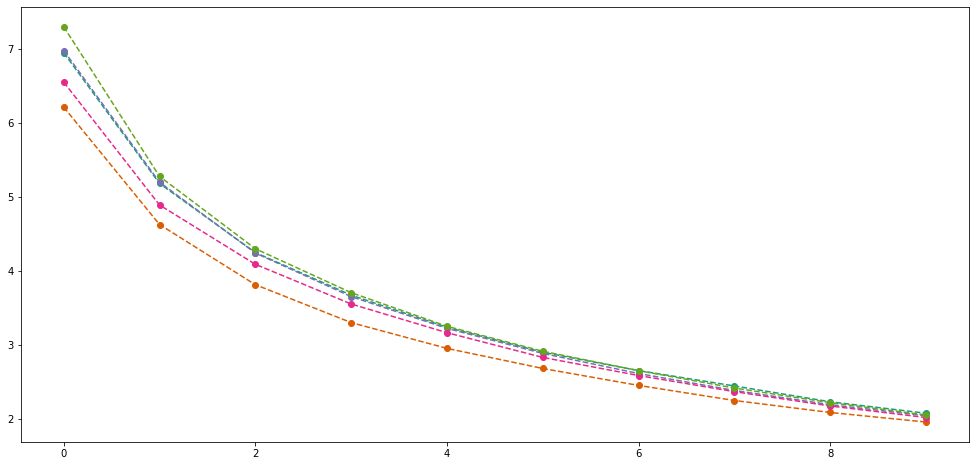

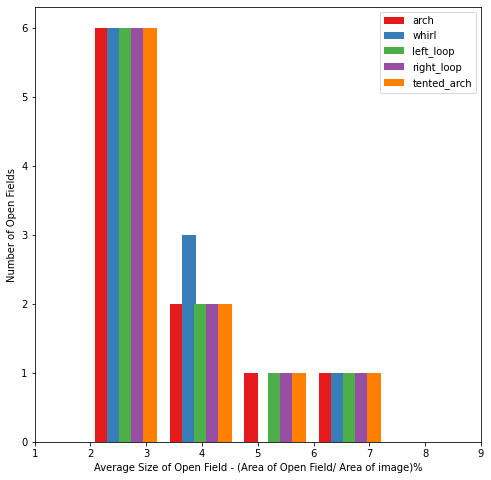

In [536]:
fig = plt.figure(figsize=(17,8))
colors = ['#1b9e77', '#d95f02', '#7570b3', '#e7298a', '#66a61e']
labels = list(average_size_per_fp.keys())
for i,v in enumerate(average_size_per_fp):
    plt.plot(average_size_per_fp[v],linestyle='--', marker='o', 
            color = colors[i], label=labels[i])
plt.show()
#print(average_size_per_fp.values())
fig = plt.figure(figsize=(8,8))
plt.hist(average_size_per_fp.values(),
             histtype='bar', color=['#e41a1c','#377eb8','#4daf4a',
                                              '#984ea3','#ff7f00'], 
             bins=4,label=labels, align='mid',width=.25)
plt.ylabel('Number of Open Fields')
plt.xlabel('Average Size of Open Field - (Area of Open Field/ Area of image)%')
plt.xticks(range(1,10))
#np.linspace(1, 8, 10)
#plt.yticks(range(0,10,1))

plt.legend()
plt.show()

In [228]:
file = open('/mnt/d/Biometrics Project/python/open_fields/open/open_fields.txt')
total_dict_of_circles = json.load(file)


file = open('/mnt/d/Biometrics Project/python/open_fields/file_names.txt')
f = file.readlines()
i = 'F0002_05'
for i in f:
    im = cv.imread(f'/mnt/d/Biometrics Project/python/open_fields/open/{i.split()[0]}_min.bmp')
    area_of_image = im.shape[0]*im.shape[1]
    print(area_of_image)

src = cv.imread(f'/mnt/d/Biometrics Project/python/open_fields/{i.split()[0]}.bmp')
print(src.shape)
fp_circles = []
area_of_image = 512*512

245760
236640
150463
245760
245760
229920
227520
190080
233280
241920
243270
244736
245760
245760
235680
219450
245760
240000
244320
245760
239520
245760
228480
245760
238080
243200
243200
204595
245760
183416
221792
245760
199200
212640
245760
238560
245760
236544
244736
245760
245760
245760
237069
245760
245760
245760
245760
242880
219360
241152
232596
245760
239040
222343
207360
245760
239040
198891
231800
206400
245760
245760
244320
243360
208320
216000
237120
245760
230384
235520
245760
209150
225120
245760
236640
152425
245760
245760
245248
245760
166662
245760
242688
231840
233984
237056
236032
205440
230400
202860
211680
184943
240128
245760
206800
245760
230400
245760
204480
245760
245760
234240
225184
245760
245760
245248
245760
232315
211140
238560
237120
243840
245760
231165
245760
245760
245760
245760
245760
245760
226540
244800
230770
235668
245760
241332
203112
245248
235680
245760
245760
245760
245760
223254
234087
245760
238080
245760
221368
185280
211820
245760
232320

214896
245760
237120
245760
193920
230880
245760
207009
245760
237120
245760
212574
245760
245760
240000
245760
243360
218500
245760
231936
245760
195993
238832
236032
237120
245760
245760
167754
241440
236640
232448
236160
245760
191268
203846
245760
245760
245760
244224
216000
173280
245760
245760
245760
245760
226816
220388
185968
245760
239268
218700
234220
245760
241152
233280
245760
238080
240480
219008
245760
245760
229440
219360
243712
245760
245760
237056
237568
214722
245760
230880
245760
245760
242400
240000
215040
228480
213600
244320
226080
245760
229890
203850
245760
245248
228960
175644
200415
227046
207298
245760
232624
245760
245760
245760
229920
238080
214560
245760
220704
240480
215825
242176
245760
204223
213894
245760
150240
214802
245760
236160
241664
243360
177123
186264
241416
245760
216960
245760
245760
225600
245760
245760
245760
245760
237948
226560
237600
245760
245760
239428
245760
210868
231360
177460
245760
245760
245760
245760
208800
225120
212232
230880

AttributeError: 'AxesSubplot' object has no attribute 'colorbar'

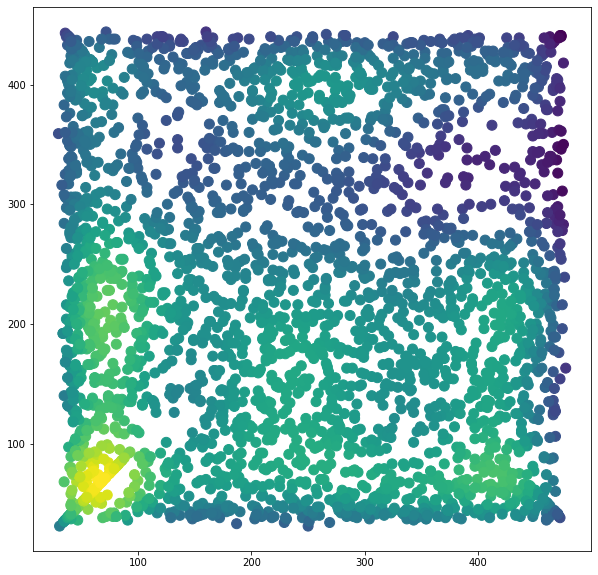

In [44]:
x = men_x
y = men_y


xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
#fig, ax = plt.subplots()

ax.scatter(x, y, c=z, s=100)
ax.colorbar()
plt.show()


fig = plt.figure()
fig.add_subplot(1,1,1)
#plt.figure(figsize = (8,8))
plt.hist(y[:,:10].mean(axis=0), bins=4)
plt.title('Histogram of Average Area size of 10 largest openfields per fingerprint - 4 bins')
plt.show()

In [25]:
number of circles vs size of it? 
kde of histograms, and stack it 
change area % calculation
scatter density
scatter density 

[[8.251747131347656,
  5.217681884765625,
  3.1155166625976562,
  3.1155166625976562,
  2.759765625,
  2.759765625,
  2.6459732055664062,
  2.5345764160156254,
  2.2147598266601562,
  1.729644775390625,
  1.6398086547851562,
  1.384674072265625,
  1.2265625,
  1.0073623657226562,
  0.9390869140625001,
  0.9390869140625001,
  0.8732070922851562,
  0.8732070922851562,
  0.8732070922851562,
  0.809722900390625,
  0.809722900390625,
  0.7486343383789062,
  0.6336441040039064,
  0.579742431640625,
  0.579742431640625],
 [4.3121337890625,
  4.029449462890625,
  3.3646621704101562,
  2.994537353515625,
  2.759765625,
  2.759765625,
  2.6459732055664062,
  2.4255752563476562,
  2.4255752563476562,
  2.3189697265625,
  2.0135269165039062,
  1.91650390625,
  1.729644775390625,
  1.6398086547851562,
  1.4673233032226562,
  1.4673233032226562,
  1.384674072265625,
  1.078033447265625,
  1.078033447265625,
  0.9390869140625001,
  0.9390869140625001,
  0.8732070922851562,
  0.809722900390625,
  0.80